In [ ]:
import numpy as np
import datetime
import os
import random
import pickle
from glob import glob

from src.data_preparation import coloc_dataset
from src.modelling import model_distri

import src.utils.tardisml_utils as tardisml_utils

In [2]:
from src.visualization import visu_mdl_distri as vmd

In [3]:
from importlib import reload

In [4]:
# Convert distribution of X samples to distribution on SIT TOPAZ5 categories

    
def convert_y_to_proba(sp_distri, bins=None):
    '''Convert y from array of values (raw distributions)
                 to  probabilities of bins (distributions projected on bins)

    Parameters:
    -----------
        sp_distri:    np.array of SIT obss, dimensions (TP4 pixel, X IS2 observations)
        bins     :    if None, bins of TOPAZ5 sea ice categories will be used


    Normalization:
    https://stackoverflow.com/questions/5498008/pylab-histdata-normed-1-normalization-seems-to-work-incorrect

    '''
    
    if bins is None:
        bins = np.array([0, 0.64, 1.39, 2.47, 4.57, 30])


    # y_tmp = self.sp_distri.copy()

    n = sp_distri.shape[0]
    nbins = len(bins)-1
    y_prob = np.zeros((n, nbins))

    for idx in range(n):
        # instead of : density=True (shows sum >1 in some cases), using weights 
        y_prob[idx] = np.histogram(sp_distri[idx], bins=bins, 
                                   weights=np.ones_like(sp_distri[idx])/float(len(sp_distri[idx]))
                                  )[0]

    #self.sp_distri = y_prob
    return y_prob

In [5]:
def check_valid_days(arr_days):
    '''Check that ICESat2 colocated dataset is avalaible for each days
    If no data for one day, it is removed from the list
    
    Parameters:
    ------------
    
        arr_days     :    1D numpy array of datetime object. contains all days to be loaded in dataset
    '''

    dir_IS2 = '/scratch/project_465000269/edelleo1/Leo/SIT_observations/IS2SITDAT4_co_TOPAZ/'
    ndays = len(arr_days)
    
    for idx, dy in enumerate(arr_days[::-1]):
        str_date = f'{dy.strftime("%Y%m%d")}'
        if not os.path.exists(os.path.join(dir_IS2, str_date)):
            arr_days = np.delete(arr_days, ndays-(idx+1))
#             print(f'Index {idx} removed: {str_date}')
            
    return arr_days

In [3]:
rootdir = tardisml_utils.get_rootdir()

In [4]:
rootdir

'/scratch/project_465000269/edelleo1/'

In [7]:
from importlib import reload

In [8]:
from src.utils import load_Dconfig
from src.utils import tardisml_utils

In [9]:
file_dconfig = '../config/Dconfig_default.yaml'

In [10]:
rootdir = tardisml_utils.get_rootdir()

In [11]:
config = load_Dconfig.DConfig(file_dconfig, rootdir=rootdir, verbose=1)

Config file found: ../config/Dconfig_default.yaml
PCA results in: /scratch/project_465000269/edelleo1/Leo/results/pca_i100-550_j150-629
Config file updated 'pca_dir': ../config/Dconfig_default.yaml
Results in: /scratch/project_465000269/edelleo1/Leo/results/distri_240305-093439
Folder created

Subfolder created: /scratch/project_465000269/edelleo1/Leo/results/distri_240305-093439/ml/
Subfolder created: /scratch/project_465000269/edelleo1/Leo/results/distri_240305-093439/figures/
Config file updated 'results_dir': ../config/Dconfig_default.yaml
Config folders updated.
Config copied to: /scratch/project_465000269/edelleo1/Leo/results/distri_240305-093439
Config file found: /scratch/project_465000269/edelleo1/Leo/results/distri_240305-093439/Dconfig_default.yaml
Default config file is now the copied following one:
/scratch/project_465000269/edelleo1/Leo/results/distri_240305-093439/Dconfig_default.yaml


In [12]:
# ----------------------------------------
#               Get params
# ---------------------------------------- 

d1 = config.d1
d2 = config.d2

var_to_exclude = config.var_to_exclude

In [40]:
var_to_exclude = None

In [48]:
reload(coloc_dataset)

<module 'src.data_preparation.coloc_dataset' from '/users/edelleo1/tardis/tardis-ml/src/data_preparation/coloc_dataset.py'>

In [78]:
# ----------------------------------------
#               Import dataset
# ----------------------------------------

y_as_proba = False  # True
nbins = 5  # Sea ice categories of TOPAZ5


# Dates to import dataset
d1 = datetime.datetime(2018, 10, 14)
d2 = datetime.datetime(2018, 10, 15) 
# d2 = datetime.datetime(2019, 4, 30)
# d2 = datetime.datetime(2019, 10, 14) 


# d1 = datetime.datetime(2019, 12, 30) 
# d2 = datetime.datetime(2020, 1, 2) 




tmp_days = np.array([d1 + datetime.timedelta(days=x) for x in range((d2-d1).days + 1)])
# remove non valid days
all_days = check_valid_days(tmp_days)


# ['SIT', 'month', 'lat', 'lon', 'siconc', 'sisnthick', 'zos', 'vxsi', 'vysi', 
# '2T', 'MSL', 'TP', '10V', '10U', 'SSR', 'STR', 'sia']
# var_to_exclude = ['lon', 'sia']
# var_to_exclude = ['sia']

In [79]:
ds = coloc_dataset.DatasetTrain(days=all_days, config=config, rootdir=rootdir, ml_dir=config.ml_dir, y_as_proba=y_as_proba,
                               convert_month_to_day=True)


ds.exclude_var(var_to_exclude=var_to_exclude)

ds.check_nan()
ds.dataset_split()
ds.assemble_dataset(scaling=True, var_to_exclude=var_to_exclude)

Importing...
	 2018-10-14
	 2018-10-15
No variable to exclude
Config file updated 'nfeat': /scratch/project_465000269/edelleo1/Leo/results/distri_240305-093439/Dconfig_default.yaml
Nan in X:  30 samples
Size of the training set:      871 TOPAZ pixels
Size of the validation set:    186 TOPAZ pixels
Size of the test set:          188 TOPAZ pixels
Scaling data...
Scaler saved as: /scratch/project_465000269/edelleo1/Leo/results/distri_240305-093439/ml/ScalerMM_17feat_09.pkl
Dataset assembled


In [80]:
ds.features

['SIT',
 'month',
 'lat',
 'lon',
 'siconc',
 'sisnthick',
 'zos',
 'vxsi',
 'vysi',
 '2T',
 'MSL',
 'TP',
 '10V',
 '10U',
 'SSR',
 'STR',
 'sia']

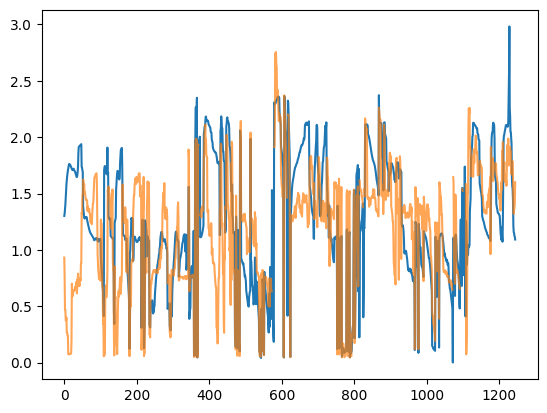

In [82]:
plt.plot(ds.sp_tp[:,0])
plt.plot(ds.sp_tp[:,-1], alpha=0.7)

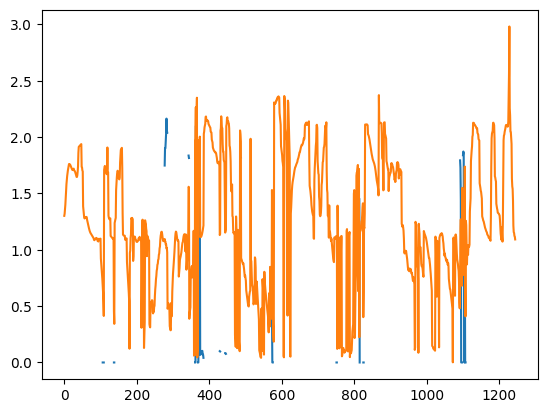

In [75]:
plt.plot(ds.sp_tp[:,-1])
plt.plot(ds.sp_tp[:,0])

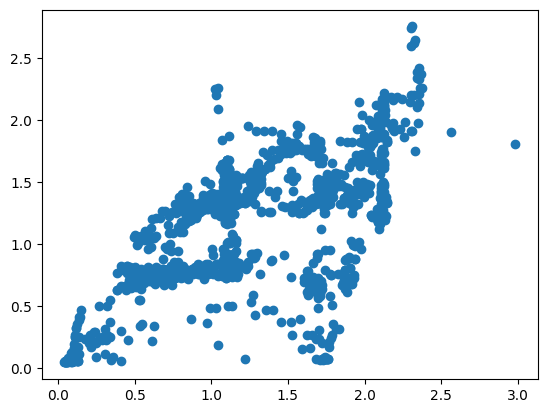

In [83]:
plt.scatter(ds.sp_tp[:,0], ds.sp_tp[:,-1])

 # ---------------------------------------------------------------------

 # ---------------- Draw exploration ---------------------------

 # ---------------------------------------------------------------------

## Compute mean and std for every distribution

In [10]:
mean = []
std = []
n_distri = ds.dataset['y'].shape[0]


for i in range(n_distri):
    mean.append(np.nanmean(ds.dataset['y'][i]))
    std.append(np.nanstd(ds.dataset['y'][i]))
    

mean = np.array(mean)  # ICESat2
std = np.array(std)  # ICESat2

diff = mean - ds.sp_tp[:,0]    # ICESat2 - TOPAZ4b

In [194]:
# ds.sp_tp[:,1]  # time converted from 'month' to 'days since last 1st sept'
# ds.sp_tp[:,2]  # lat
# ds.sp_tp[:,3]  # lon

## Typical distribution

In [285]:
peak = np.where((mean<1)&(std<1))[0]
flat = np.where((mean>2)&(std>3))[0]
norm = np.where((mean>1)&(mean<2)&(std>1)&(std<3))[0]


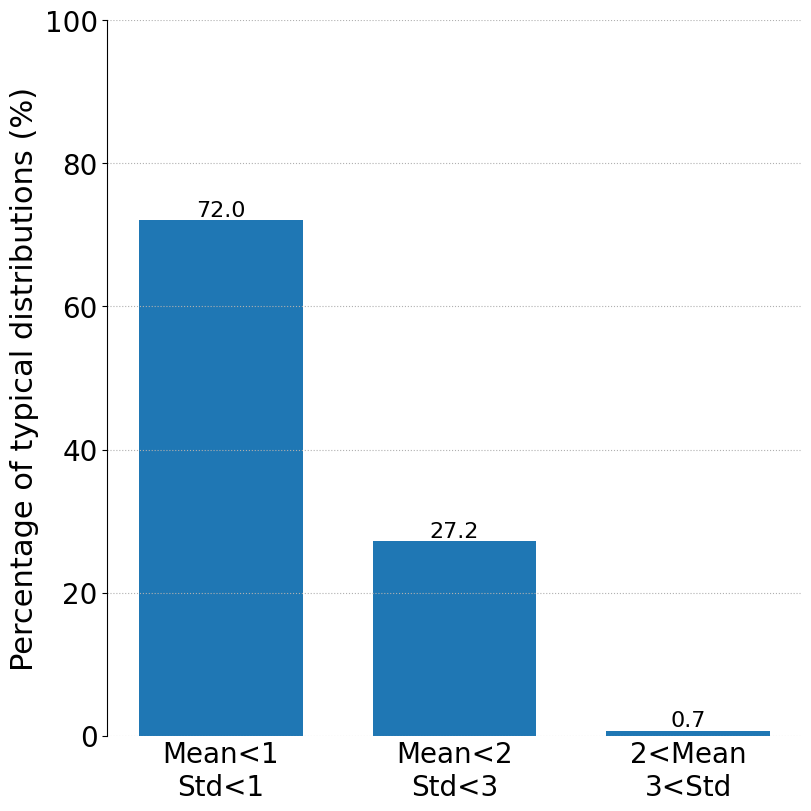

In [364]:
vcd.draw_typical_distribution(mean, std)#, savefig=True)

## Does it matter after 4m ?

Because it will be classified correctly anyway as there is only 1 TOPAZ bin 4+

In [ ]:
idx = np.random.randint(0, flat.size)
print(idx)

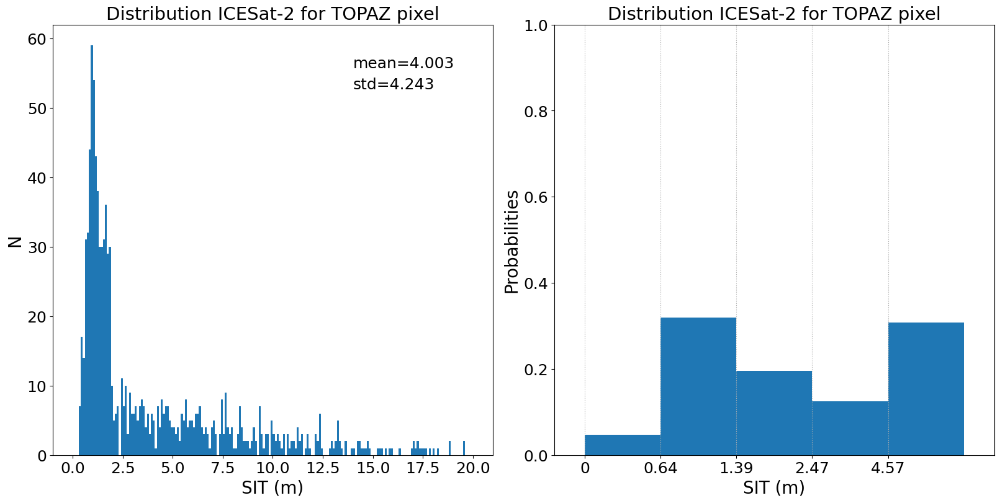

In [274]:
ytrue = ds.dataset['y'][flat[idx]]
# ytrue_proba = convert_y_to_proba(np.array([ytrue]))

# ytrue is convert to ytrue_proba in function vmd.hist_hitsp_obs()
# if plot for high number, then would be better to convert before and just plot in function

vmd.hist_histp_obs(ytrue, bins=np.arange(0,20+.1,.1), showfig=True, savefig=False)

 # ---------------------------------------------------------------------

## Draw Distribution spatial of bias

In [9]:
import matplotlib.pyplot as plt 
from mpl_toolkits.basemap import Basemap

from src.utils import modif_plot
from src.utils import save_name

from src.utils import quickplot

In [10]:
from src.visualization import visu_co_IS2_TP as vcd

Saved as: /scratch/project_465000269/edelleo1/Leo/results/explore_DS_co_IS2_TP/spatial_bias_201811.png


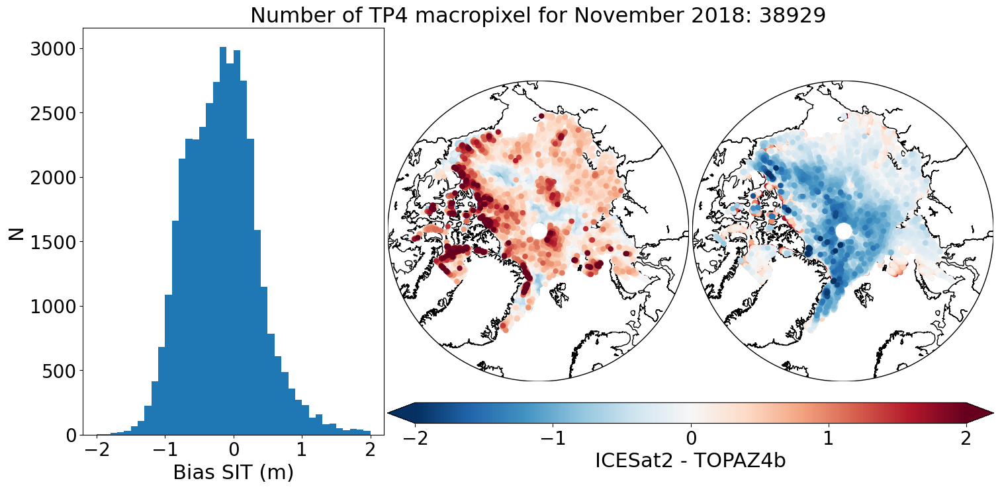

In [197]:
# For the Month of November
# idx_nov = np.where(month==11)[0]
# ln, lt, di = sort_bias(lon[idx_nov], lat[idx_nov], diff[idx_nov])
# odir='/scratch/project_465000269/edelleo1/Leo/results/explore_DS_co_IS2_TP/'
# vcd.draw_bias_month(ln, lt, di, title_MnYr='November 2018', savefig=True, odir=odir)

In [13]:
# Sort with highest diff on top
def sort_bias(x, y, z):
    idx = z.argsort()
    x, y, z = x[idx], y[idx], z[idx]

    return x, y, z    

In [63]:
# month = ds.sp_tp[:,1]
lat = ds.sp_tp[:,2]
lon = ds.sp_tp[:,3]

In [15]:
years = range(d1.year, d2.year+1)

In [68]:
year = ds.year
month = ds.month

In [53]:
from src.visualization import visu_co_IS2_TP as vcd

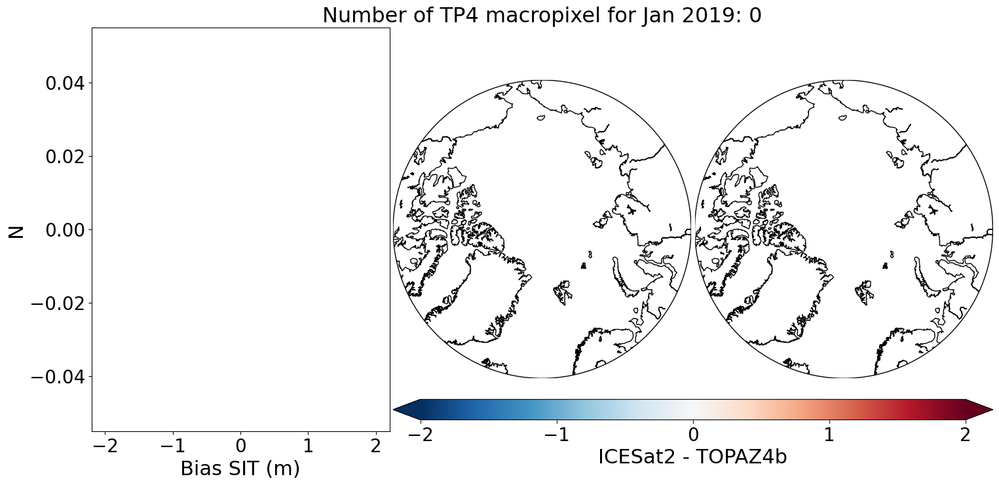

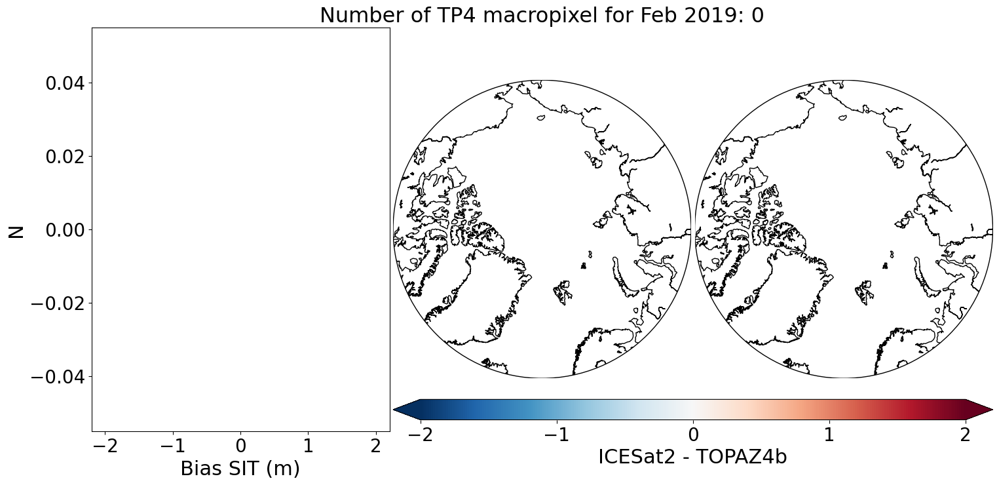

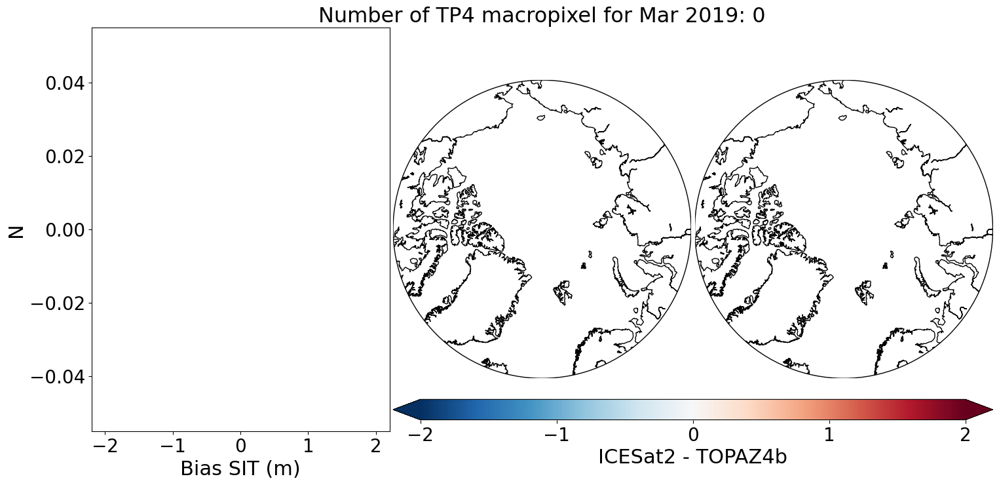

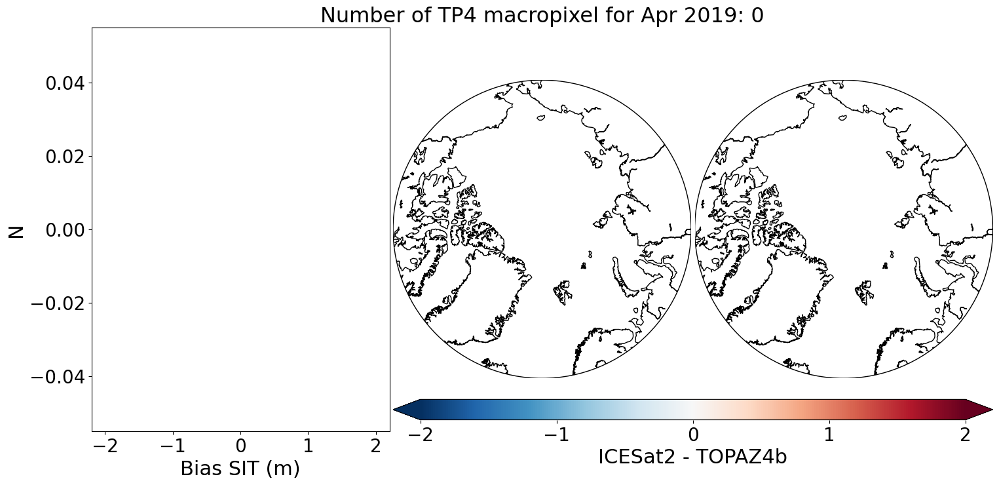

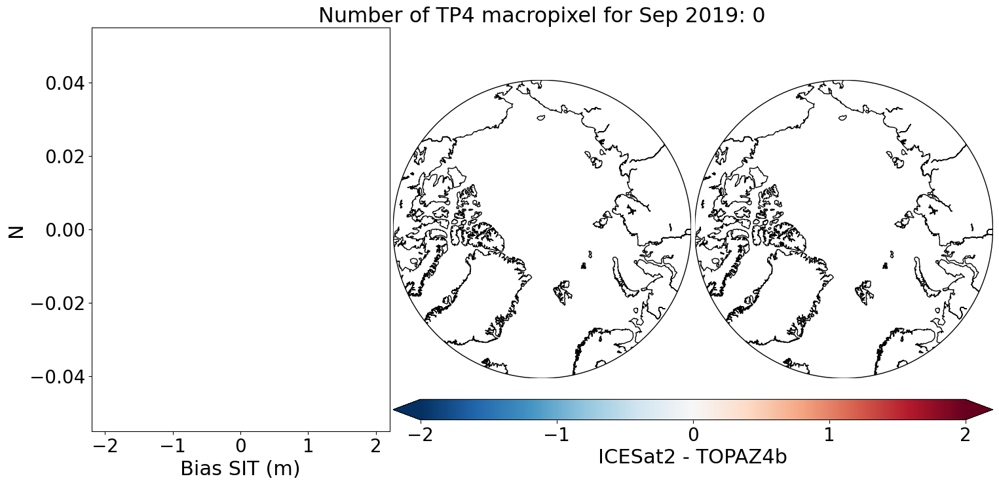

...

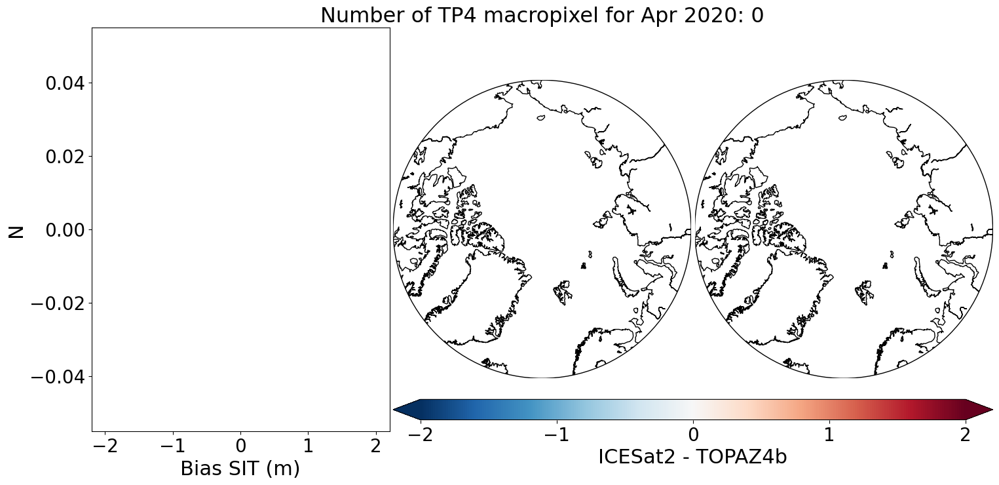

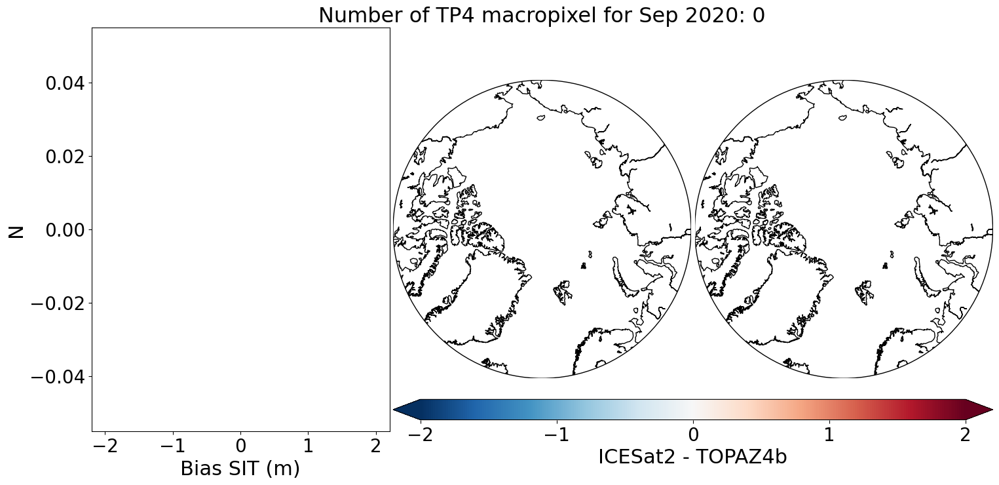

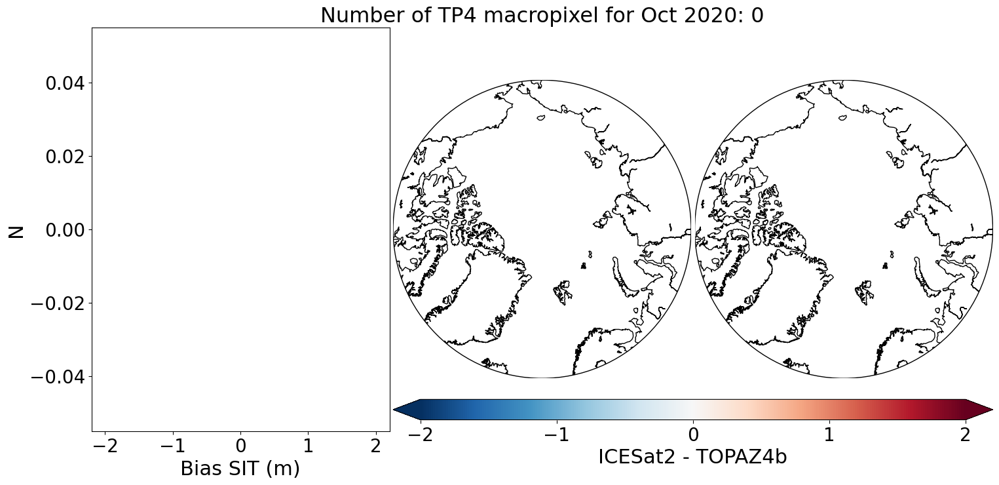

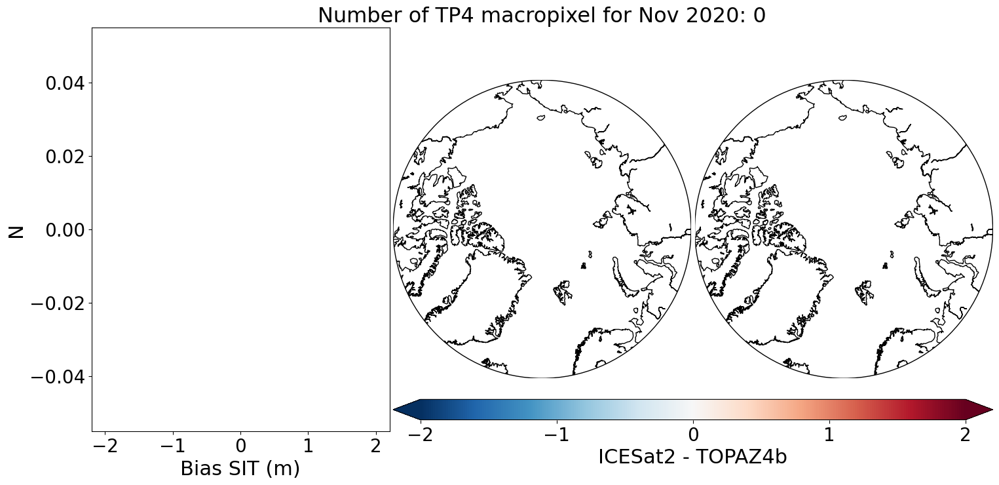

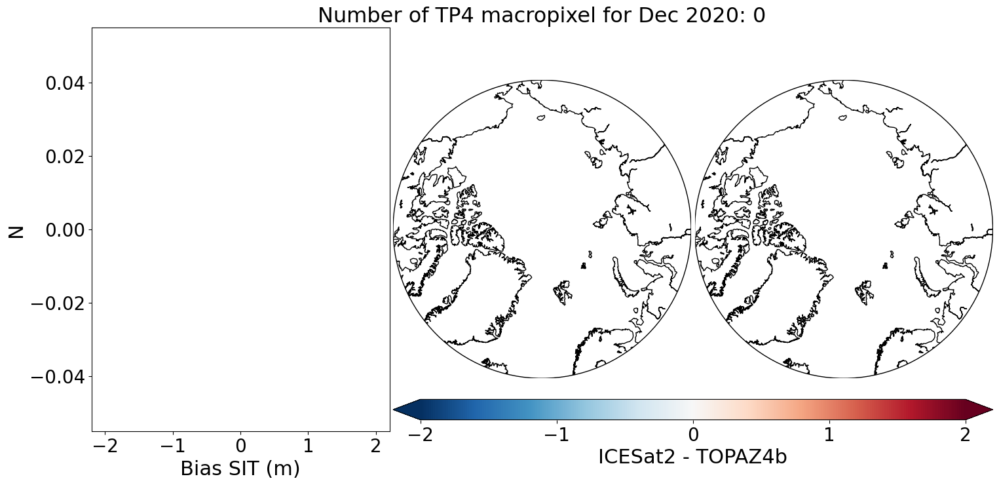

In [71]:
# Draw plots

months = [1,2,3,4,9,10,11,12]  # Months available with ICESat2 data
months_str = {1:'Jan', 2:'Feb', 3:'Mar', 4:'Apr', 9:'Sep', 10:'Oct', 11:'Nov', 12:'Dec'}
odir='/scratch/project_465000269/edelleo1/Leo/results/explore_DS_co_IS2_TP/'

for yr in years:
    for mn in months:
        idx_mn = np.where((month==mn)&(year==yr))[0] 
        ln, lt, di = sort_bias(lon[idx_mn], lat[idx_mn], diff[idx_mn])
        vcd.draw_bias_month(ln, lt, di, title_MnYr=f'{months_str[mn]} {yr}', filename_YrMn=f'{yr}{mn:02d}',
                       odir=odir, savefig=False, showfig=True)

 # ---------------------------------------------------------------------

# Draw SIT diff as function of SIT

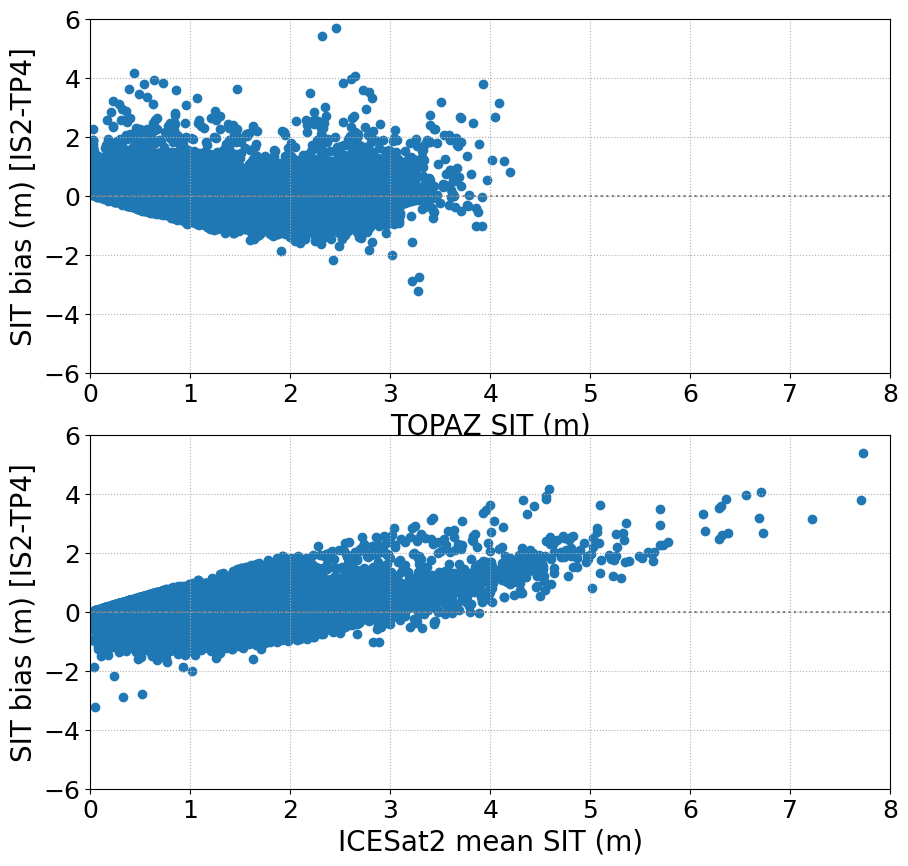

In [33]:
draw_SIT_bias(mean, ds.sp_tp[:,0], diff)

In [32]:
def draw_SIT_bias(mean_IS, mean_TP, bias, odir='', savefig=False, showfig=True):
    '''
    '''
    
    # -----------------------------------------
    # fig, axes = plt.subplots(ncols=2, constrained_layout=False, figsize=(10,8))
    fig = plt.figure(figsize=(16, 10), constrained_layout=False)

    gs1 = fig.add_gridspec(nrows=8, ncols=8, left=0.0, right=0.5, wspace=1, hspace=1.5)
    ax = fig.add_subplot(gs1[:4, :])  # y, x
    ax2 = fig.add_subplot(gs1[4:, :])
#     cax1 = fig.add_subplot(gs1[8:, 1:15], aspect=.15)
    
    # -----------------------------------------
    
    ax.scatter(mean_TP, bias)
    
    ax.plot([-1,30], [0,0], ls=':', c='grey', zorder=100)

#     ax.set_title(f'Distribution ICESat-2 for {mean_IS.shape[0]} TOPAZ pixels')
    ax.set_xlabel('TOPAZ SIT (m)')
    ax.set_ylabel('SIT bias (m) [IS2-TP4]')

    ax.grid(zorder=-10, ls=':')
    
    ax.set_xlim([0, 8])
    ax.set_ylim([-6, 6])
    
    # -----------------------------------------
    
    ax2.scatter(mean_IS, bias)

    ax2.plot([-1,30], [0,0], ls=':', c='grey', zorder=100)
        
    ax2.set_xlabel('ICESat2 mean SIT (m)')
    ax2.set_ylabel('SIT bias (m) [IS2-TP4]')
    
    ax2.grid(zorder=-10, ls=':')
    
    ax2.set_xlim([0, 8])
    ax2.set_ylim([-6, 6])
    
    # -----------------------------------------
    modif_plot.resize(fig, s=18)
    
    
    if savefig:
        ofile = f'bias_vs_IS2_vs_TP4.png'
        ofile = save_name.check(odir, ofile)
        plt.savefig(f"{odir}{ofile}", dpi=100, bbox_inches='tight')
        print(f'Saved as: {odir}{ofile}')

    if showfig:
        plt.show()

    plt.close() 
    

In [65]:
draw_mean_vs_std_zDIFF(mean, std, diff)

> /tmp/ipykernel_190213/486059619.py(35)draw_mean_vs_std_zDIFF()
     33 
     34 
---> 35     for i in bins:
     36         for j in bins:
     37             x_in_bin = (x >= xedges[i]) & (x < xedges[i + 1])

ipdb> bins
array([0.  , 0.02, 0.04, 0.06, 0.08, 0.1 , 0.12, 0.14, 0.16, 0.18, 0.2 ,
       0.22, 0.24, 0.26, 0.28, 0.3 , 0.32, 0.34, 0.36, 0.38, 0.4 , 0.42,
       0.44, 0.46, 0.48, 0.5 , 0.52, 0.54, 0.56, 0.58, 0.6 , 0.62, 0.64,
       0.66, 0.68, 0.7 , 0.72, 0.74, 0.76, 0.78, 0.8 , 0.82, 0.84, 0.86,
       0.88, 0.9 , 0.92, 0.94, 0.96, 0.98, 1.  , 1.02, 1.04, 1.06, 1.08,
       1.1 , 1.12, 1.14, 1.16, 1.18, 1.2 , 1.22, 1.24, 1.26, 1.28, 1.3 ,
       1.32, 1.34, 1.36, 1.38, 1.4 , 1.42, 1.44, 1.46, 1.48, 1.5 , 1.52,
       1.54, 1.56, 1.58, 1.6 , 1.62, 1.64, 1.66, 1.68, 1.7 , 1.72, 1.74,
       1.76, 1.78, 1.8 , 1.82, 1.84, 1.86, 1.88, 1.9 , 1.92, 1.94, 1.96,
       1.98, 2.  , 2.02, 2.04, 2.06, 2.08, 2.1 , 2.12, 2.14, 2.16, 2.18,
       2.2 , 2.22, 2.24, 2.26, 2.28, 2.3 , 2.32

--KeyboardInterrupt--

KeyboardInterrupt: Interrupted by user


IndexError: only integers, slices (`:`), ellipsis (`...`), numpy.newaxis (`None`) and integer or boolean arrays are valid indices

In [63]:
def draw_mean_vs_std_zDIFF(x, y, diff, bin_max=4, bw=0.02, odir='', savefig=False, showfig=True):

    # Define the number of bins
#     bins = 20
    bins = np.arange(0, bin_max+bw, bw)
    

    # Create a 2D histogram
    hist, xedges, yedges = np.histogram2d(x, y, bins=bins)
    
    
    # Compute the median value for each bin
#     x_indices = np.digitize(x, xedges) - 1
#     y_indices = np.digitize(y, yedges) - 1
    
#     # Combine x and y indices to a single index
#     indices = x_indices * bins + y_indices

#     Calculate median values using np.unique
#     unique_indices, counts = np.unique(indices, return_counts=True)
    median_values_z = np.zeros((len(bins), len(bins)), dtype=float)

#     for i, index in enumerate(unique_indices):
# #         x_in_bin = x[indices == index]
# #         y_in_bin = y[indices == index]
# #         combined_data = np.concatenate((x_in_bin, y_in_bin))

#         z_in_bin = diff[indices == index]
        
#         median_values_z[i] = np.median(z_in_bin)  # combined_data)

    import pdb; pdb.set_trace()
    

    for i in bins:
        for j in bins:
            x_in_bin = (x >= xedges[i]) & (x < xedges[i + 1])
            y_in_bin = (y >= yedges[j]) & (y < yedges[j + 1])
            z_in_bin = z[x_in_bin & y_in_bin]
            median_values_z[i, j] = np.median(z_in_bin)     



    import pdb; pdb.set_trace()
        
    # Reshape median values to match histogram shape
    median_values_z_2d = median_values_z.reshape((bins, bins))

    # Plot the 2D histogram with median values
    plt.hist2d(x, y, bins=bins, cmap='viridis')
    plt.colorbar(label='Frequency')
    plt.scatter(x=xedges[:-1] + (xedges[1] - xedges[0]) / 2,
                y=yedges[:-1] + (yedges[1] - yedges[0]) / 2,
                c=median_values_2d,
                cmap='viridis',
                edgecolors='black')
#     plt.title('2D Histogram with Median Values')
#     plt.xlabel('X')
#     plt.ylabel('Y')
        
    if savefig:
        ofile = f'mean_vs_std.png'
        ofile = save_name.check(odir, ofile)
        plt.savefig(f"{odir}{ofile}", dpi=100, bbox_inches='tight')
        print(f'Saved as: {odir}{ofile}')

    if showfig:
        plt.show()

    plt.close()

In [ ]:
def draw(mean_IS2, std_IS2, mean_TP, sort=True, odir='', savefig=False, showfig=True):

In [295]:
sort=True

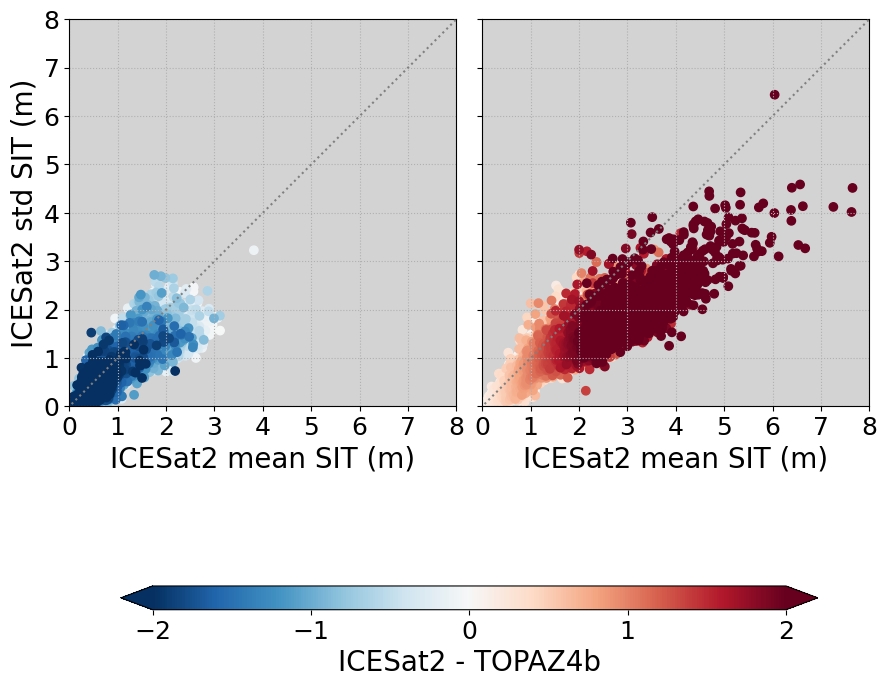

In [299]:
# /scratch/project_465000269/edelleo1/Leo/results/distri_240214-124900/
bin_max = 8

# compute 
diff = mean-ds.sp_tp[:,0]

# sort
if sort:
    idx = diff.argsort()
    mean, std, diff = mean[idx], std[idx], diff[idx]

    
idx_pos = np.where(diff>=0)[0]
idx_neg = np.where(diff<0)[0]


# -----------------------------------------
# fig, axes = plt.subplots(ncols=2, constrained_layout=False, figsize=(10,8))
fig = plt.figure(figsize=(16, 10), constrained_layout=False)

gs1 = fig.add_gridspec(nrows=9, ncols=16, left=0.0, right=0.5, wspace=1, hspace=0)
ax = fig.add_subplot(gs1[:8, :8], facecolor='lightgray')  # y, x
ax2 = fig.add_subplot(gs1[:8, 8:], facecolor='lightgray')Kan dere gi meg er rask tilbakemelding på hvilke av foreslåtte datoer dere ikke kan delta på skrivekursets tredje dag, og hvilken del av dagen dere i så fall ikke kan?
Kurse vil vare i en halv timer, og tid på dagen (før/etter lunsj) er ikke fastlagt.
cax1 = fig.add_subplot(gs1[8:, 1:15], aspect=.15)

# -----------------------------------------

# Ax left, negative value
# ax = axes[0]
ax.set_aspect('equal')

sc = ax.scatter(mean[idx_neg][::-1], std[idx_neg][::-1], c=diff[idx_neg][::-1], cmap=plt.get_cmap('RdBu_r'), vmin=-2, vmax=2)

ax.plot([-1,30], [-1,30], ls=':', c='grey', zorder=100)

# ax.set_title(f'Distribution ICESat-2 for {mean_IS.shape[0]} TOPAZ pixels')
ax.set_ylabel('ICESat2 std SIT (m)')
ax.set_xlabel('ICESat2 mean SIT (m)')

ax.grid(zorder=-10, ls=':')
ax.set_xlim([0, bin_max])
ax.set_ylim([0, bin_max])

# -----------------------------------------
# Ax right, positive value
# ax2 = axes[1]
ax2.set_aspect('equal')

ax2.scatter(mean[idx_pos], std[idx_pos], c=diff[idx_pos], cmap=plt.get_cmap('RdBu_r'), vmin=-2, vmax=2)

ax2.plot([-1,30], [-1,30], ls=':', c='grey', zorder=100)

# ax.set_title(f'Distribution ICESat-2 for {mean_IS.shape[0]} TOPAZ pixels')
# ax2.set_ylabel('ICESat2 std SIT (m)')
ax2.set_xlabel('ICESat2 mean SIT (m)')
ax2.axes.get_yaxis().set_ticklabels([])


ax2.grid(zorder=-10, ls=':')
ax2.set_xlim([0, bin_max])
ax2.set_ylim([0, bin_max])

# -----------------------------------------
cbar = fig.colorbar(sc, cax=cax1, label='ICESat2 - TOPAZ4b', extend='both', orientation='horizontal')
cbar.set_ticks([-2,-1,0,1,2])


modif_plot.resize(fig, s=18)


In [275]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import cm
from matplotlib.colors import Normalize 
from scipy.interpolate import interpn

def density_scatter( x , y, ax = None, sort = True, bins = 20, **kwargs )   :
    """
    Scatter plot colored by 2d histogram
    """
    if ax is None :
#         fig , ax = plt.subplots()
        fig, ax = plt.subplots(constrained_layout=True, figsize=(10,8))
        ax.set_aspect('equal')

    diff = x - y
    
#     data , x_e, y_e = np.histogram2d( diff, -diff, bins = bins, density = True )
    
#     import pdb; pdb.set_trace()
    
#     z = interpn( ( 0.5*(x_e[1:] + x_e[:-1]) , 0.5*(y_e[1:]+y_e[:-1]) ) , data , np.vstack([x,y]).T , method = "splinef2d", bounds_error = False)
    z = diff
    #To be sure to plot all data
#     z[np.where(np.isnan(z))] = 0.0

    # Sort the points by density, so that the densest points are plotted last
    if sort :
        idx = z.argsort()
        x, y, z = x[idx], y[idx], z[idx]

    ax.scatter( x, y, c=diff, **kwargs )

    norm = Normalize(vmin = np.min(z), vmax = np.max(z))
    cbar = fig.colorbar(cm.ScalarMappable(norm = norm), ax=ax)
    cbar.ax.set_ylabel('Density')

    ax.set_xlim([0, 8])
    ax.set_ylim([0, 8])
    
    return ax

<AxesSubplot: >

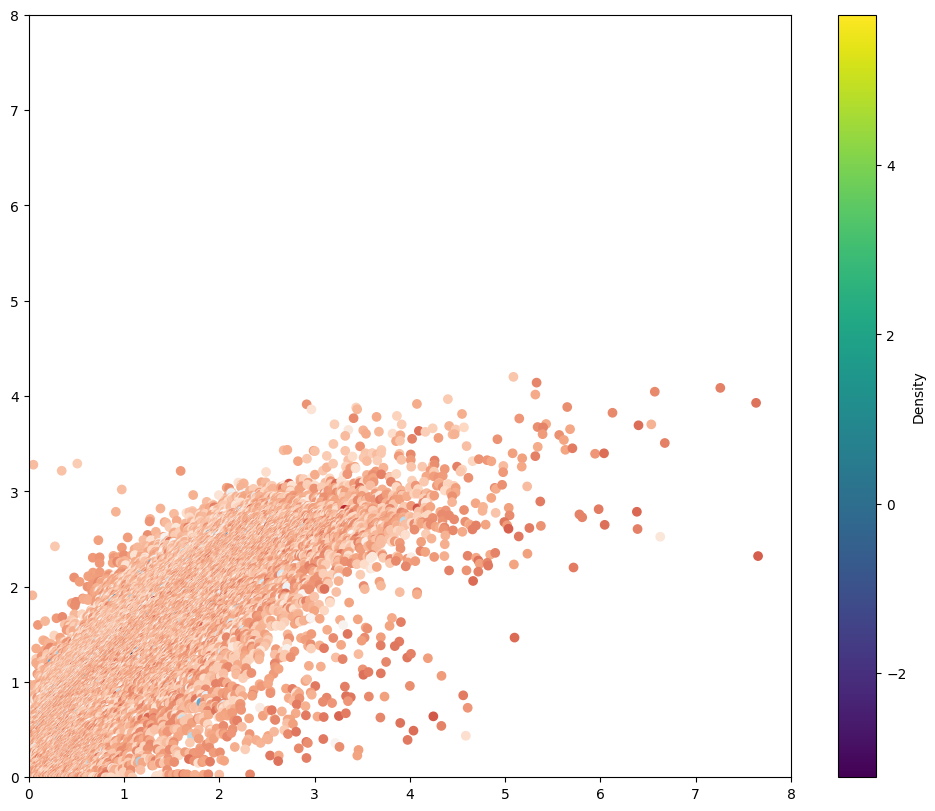

In [243]:
density_scatter(mean, ds.sp_tp[:,0], bins = [30,30], cmap=plt.get_cmap('RdBu'))

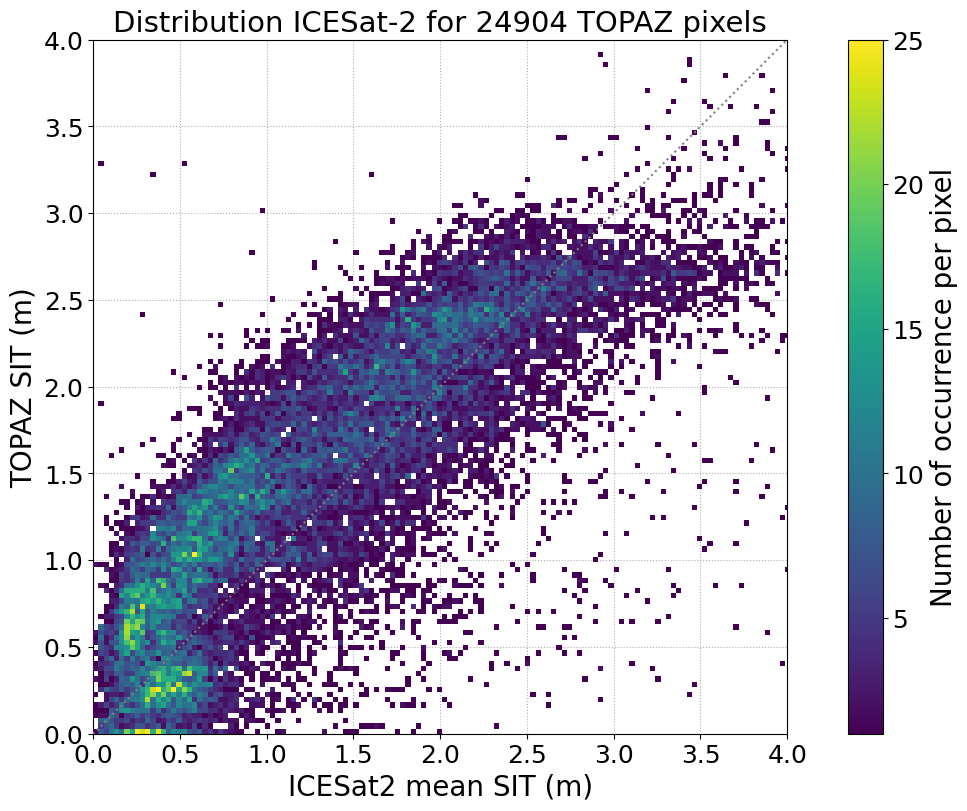

In [214]:
draw_IS2_vs_TP(mean, ds.sp_tp[:,0], bin_max=4, bw=0.03, savefig=False)

In [212]:
def draw_IS2_vs_TP(mean_IS, mean_TP, bin_max=8, bw=0.02, odir='', savefig=False, showfig=True):
    '''Plot mean VS std for each ICESat2 distributions (colocalized with TOPAZ4)
    
    Parameters:
    -----------
        
        mean_IS     :    array of float, mean SIT for each distribution with 1000 ICESat2 obs
        mean_TP     :    array of float, mean SIT from macro pixel of TOPAZ
        bin_max     :    float, highest bin
        bw          :    float, Bin Width.
        
    
    '''

    bins = np.arange(0, bin_max+bw, bw)
    
    fig, ax = plt.subplots(constrained_layout=True, figsize=(10,8))
    ax.set_aspect('equal')

    h2 = ax.hist2d(mean_IS, mean_TP, bins=bins, cmin=1, zorder=10)
#     ax.scatter(mean_IS, mean_TP, zorder=10)
    ax.plot([-1,30], [-1,30], ls=':', c='grey', zorder=100)

    ax.set_title(f'Distribution ICESat-2 for {mean_IS.shape[0]} TOPAZ pixels')
    ax.set_ylabel('TOPAZ SIT (m)')
    ax.set_xlabel('ICESat2 mean SIT (m)')

    ax.grid(zorder=-10, ls=':')
    ax.set_xlim([0, bin_max])
    ax.set_ylim([0, bin_max])
    
    fig.colorbar(h2[3], label='Number of occurrence per pixel')

    modif_plot.resize(fig, s=18)

    if savefig:
        ofile = f'IS2_vs_TP4.png'
        ofile = save_name.check(odir, ofile)
        plt.savefig(f"{odir}{ofile}", dpi=100, bbox_inches='tight')
        print(f'Saved as: {odir}{ofile}')

    if showfig:
        plt.show()

    plt.close()

In [126]:
def draw_mean_vs_std(mean, std, bin_max=4, bw=0.02, odir='', savefig=False, showfig=True):
    '''Plot mean VS std for each ICESat2 distributions (colocalized with TOPAZ4)
    
    Parameters:
    -----------
        
        mean    :    array of float, means for each distribution 
        std     :    array of float, stds for each distribution
        bin_max :    float, highest bin
        bw      :    float, Bin Width.
        
    
    '''

    bins = np.arange(0, bin_max+bw, bw)
    
    fig, ax = plt.subplots(constrained_layout=True, figsize=(10,8))
    ax.set_aspect('equal')

    h2 = ax.hist2d(mean, std, bins=bins, cmin=1, zorder=10)
    ax.plot([-1,30], [-1,30], ls=':', c='grey', zorder=-10)

    ax.set_title(f'Distribution ICESat-2 for {n_distri} TOPAZ pixels')
    ax.set_ylabel('Std SIT (m)')
    ax.set_xlabel('Mean SIT (m)')

    ax.grid(zorder=-10, ls=':')

    fig.colorbar(h2[3], label='Number of distribution per pixel')

    modif_plot.resize(fig, s=18)

    if savefig:
        ofile = f'mean_vs_std.png'
        ofile = save_name.check(odir, ofile)
        plt.savefig(f"{odir}{ofile}", dpi=100, bbox_inches='tight')
        print(f'Saved as: {odir}{ofile}')

    if showfig:
        plt.show()

    plt.close()

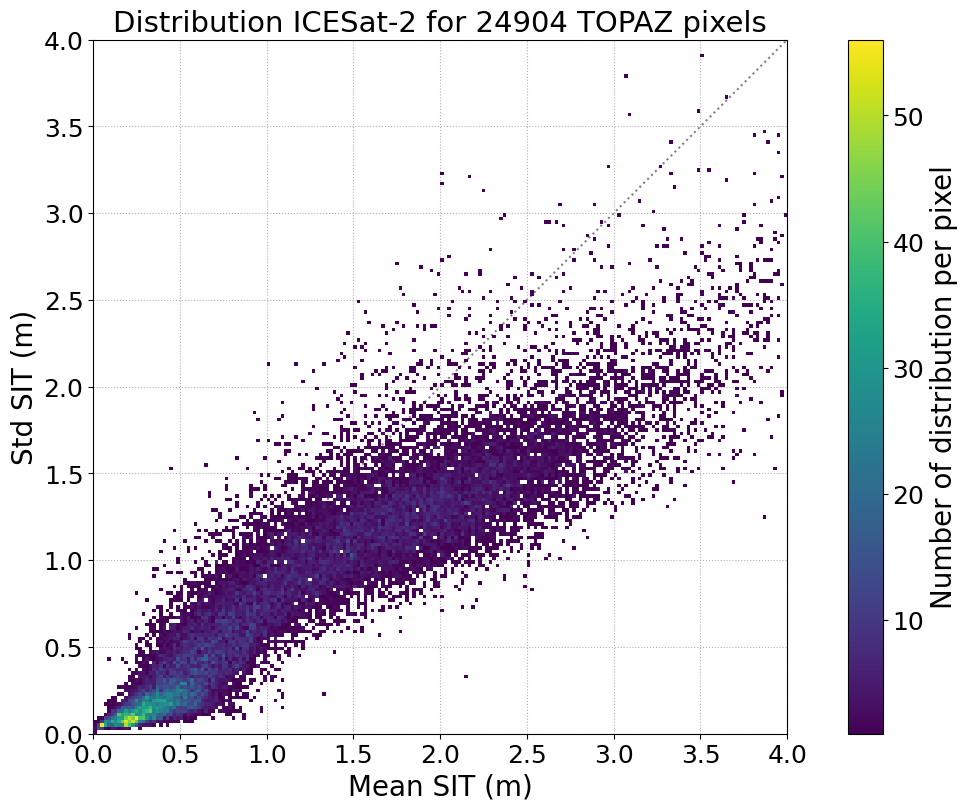

In [139]:
draw_mean_vs_std(mean, std, bin_max=4, savefig=False)

 # ---------------------------------------------------------------------

 # ---------------------------------------------------------------------

 # ---------------------------------------------------------------------

In [29]:
from importlib import reload

In [469]:
reload(model_distri)

<module 'src.modelling.model_distri' from '/users/edelleo1/tardis/tardis-ml/src/modelling/model_distri.py'>

In [ ]:
# ----------------------------------------
#               Build ML model
# ----------------------------------------


# Create data generators for each training/val/test set
# batch_size = 64  # 32 
batch_size = config.batch_size
train_generator = ds.make_generator(train=True, batch_size=batch_size)
val_generator = ds.make_generator(val=True, batch_size=batch_size)
test_generator = ds.make_generator(test=True, batch_size=batch_size)

# Build the model
m0 = model_distri.ModelDistri(ds.nfeat, ds.num_obs, nbins, rootdir, config.ml_dir)

m0.model.summary()

# Train the model
epochs = 15  #50
epochs = config.epochs

m0.fit(train_generator, epochs, val_generator)
# m0.fit(ds.dataset['Xtrain'], ds.dataset['ytrain'], epochs, (ds.dataset['Xval'], ds.dataset['yval']))

2024-02-21 16:14:18.171856: E tensorflow/compiler/xla/stream_executor/rocm/rocm_driver.cc:302] failed call to hipInit: HIP_ERROR_InvalidDevice
2024-02-21 16:14:18.171912: I tensorflow/compiler/xla/stream_executor/rocm/rocm_diagnostics.cc:112] retrieving ROCM diagnostic information for host: uan04
2024-02-21 16:14:18.171930: I tensorflow/compiler/xla/stream_executor/rocm/rocm_diagnostics.cc:119] hostname: uan04
2024-02-21 16:14:18.172094: I tensorflow/compiler/xla/stream_executor/rocm/rocm_diagnostics.cc:142] librocm reported version is: NOT_FOUND: was unable to find librocm.so DSO loaded into this program
2024-02-21 16:14:18.172113: I tensorflow/compiler/xla/stream_executor/rocm/rocm_diagnostics.cc:146] kernel reported version is: UNIMPLEMENTED: kernel reported driver version not implemented
2024-02-21 16:14:18.311305: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instru

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 15, 1)]           0         
                                                                 
 dense (Dense)               (None, 15, 64)            128       
                                                                 
 dropout (Dropout)           (None, 15, 64)            0         
                                                                 
 flatten (Flatten)           (None, 960)               0         
                                                                 
 dense_1 (Dense)             (None, 1000)              961000    
                                                                 
Total params: 961,128
Trainable params: 961,128
Non-trainable params: 0
_________________________________________________________________


2024-02-21 16:14:23.371694: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2024-02-21 16:14:23.373252: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2024-02-21 16:14:23.375060: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2024-02-21 16:14:23.376198: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2024-02-21 16:14:23.384233: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2024-02-21 16:14:23.385291: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2024-02-21 16:14:23.386404: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2024-02-21 16:14:23.390882: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2024-02-21 16:14:23.392017: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2024-02-21 16:14:23

# -----------------------------------------------------------------

In [19]:
reload(tf_visu_history)

<module 'src.visualization.tf_visu_history' from '/users/edelleo1/tardis/tardis-ml/src/visualization/tf_visu_history.py'>

In [ ]:
# ----------------------------------------
#                   Plot
# ----------------------------------------

from src.visualization import tf_visu_history
# fig_dir = 'Leo/results/distri_ml/figures/'
odir= f'{rootdir}{fig_dir}'
ofile = 'loss.png'
filename = f'{odir}{ofile}'
tf_visu_history.draw_learning_curves(m0.history, showfig=True, savefig=False, savefile=filename)

59/59 [==============================] - 0s 2ms/step


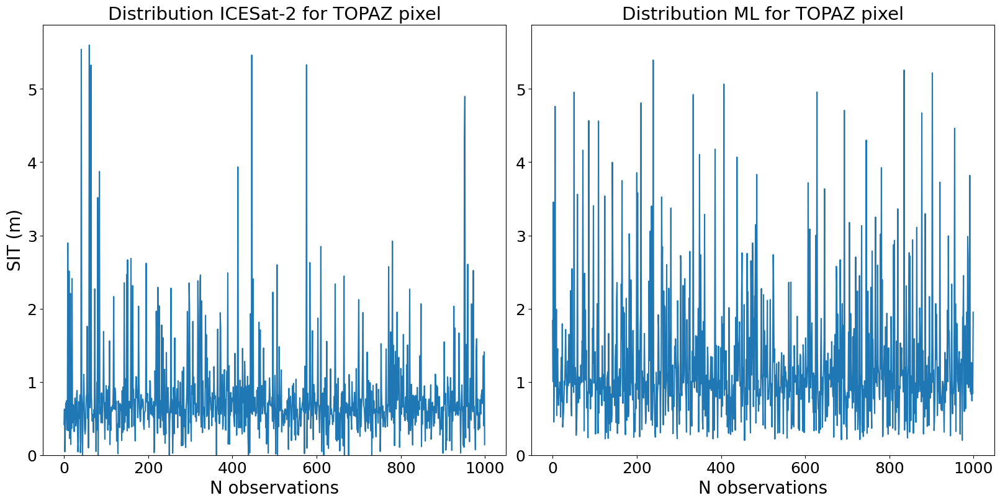

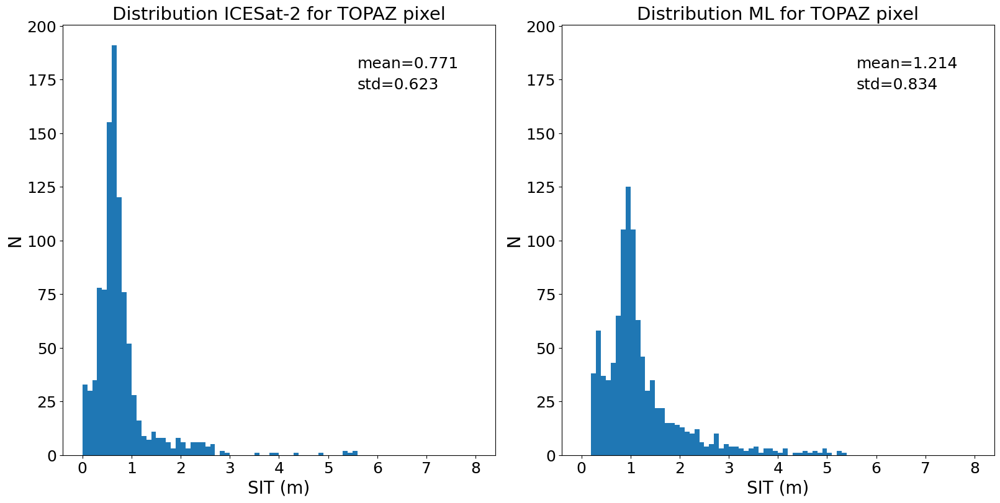

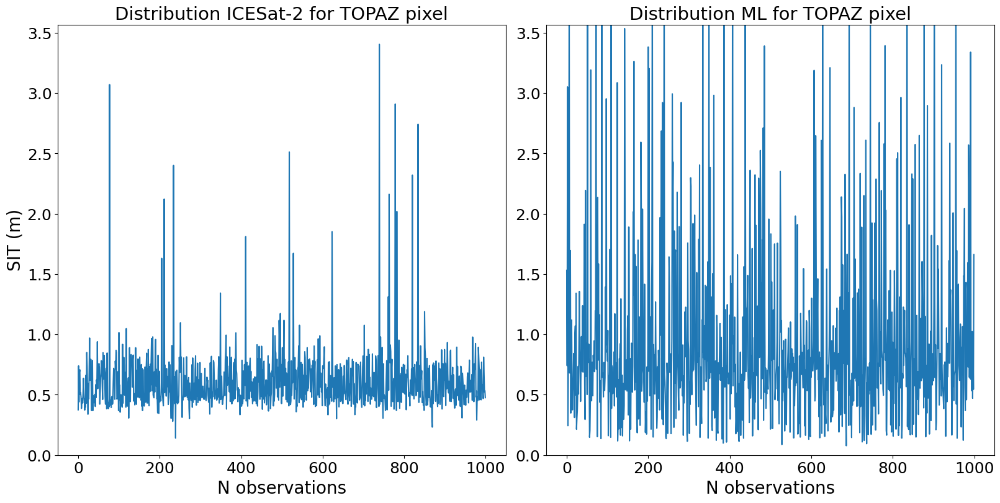

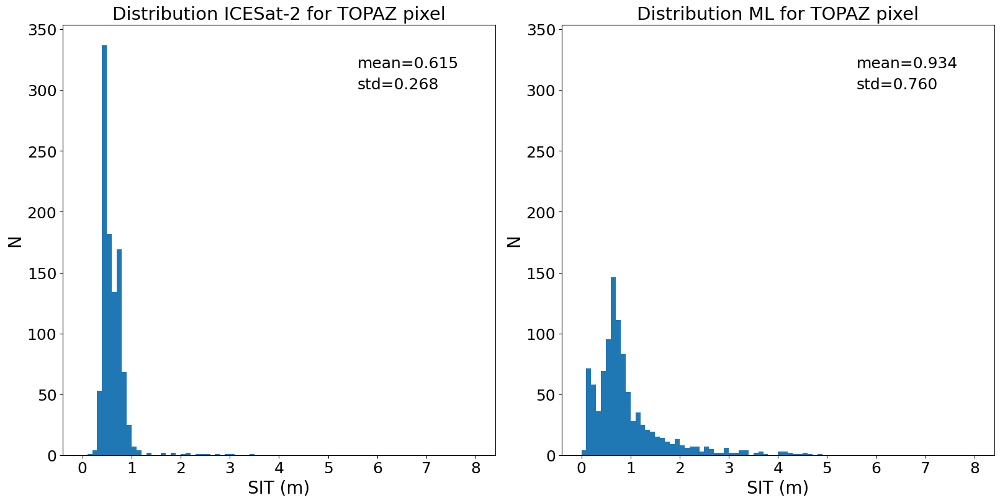

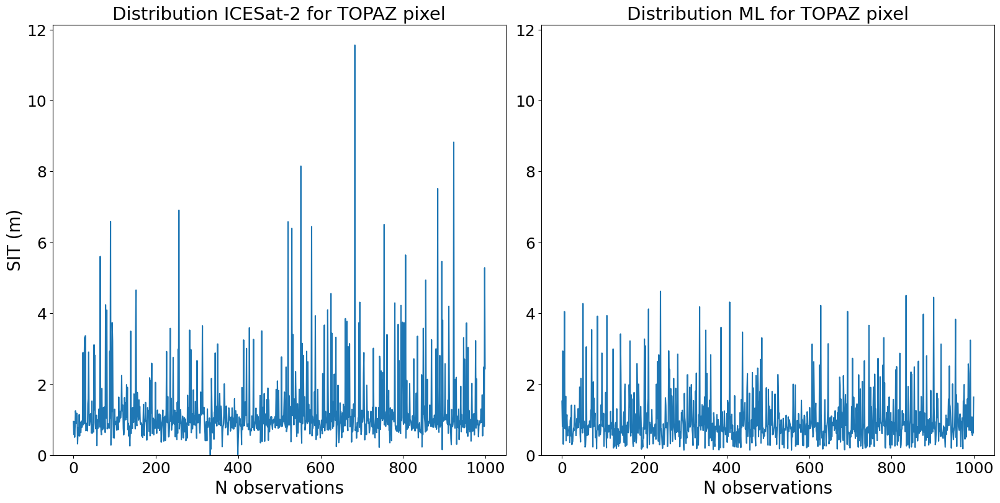

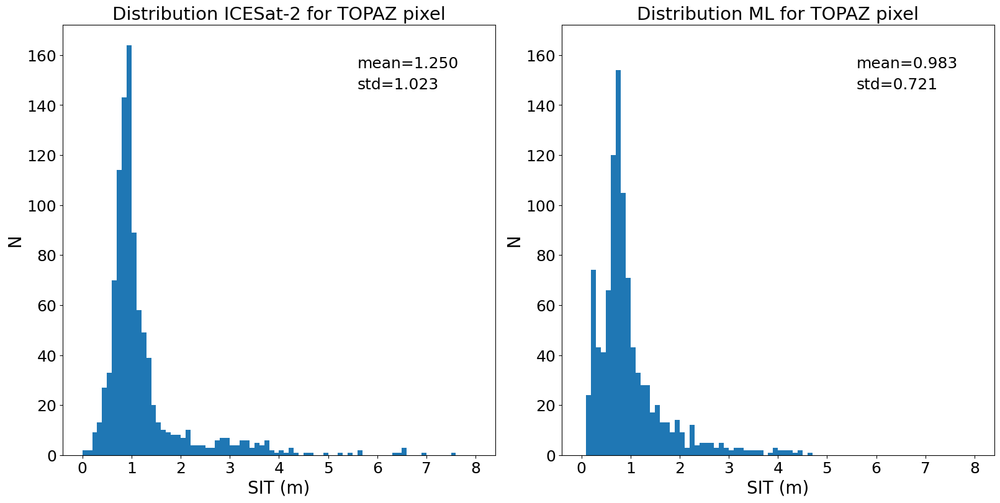

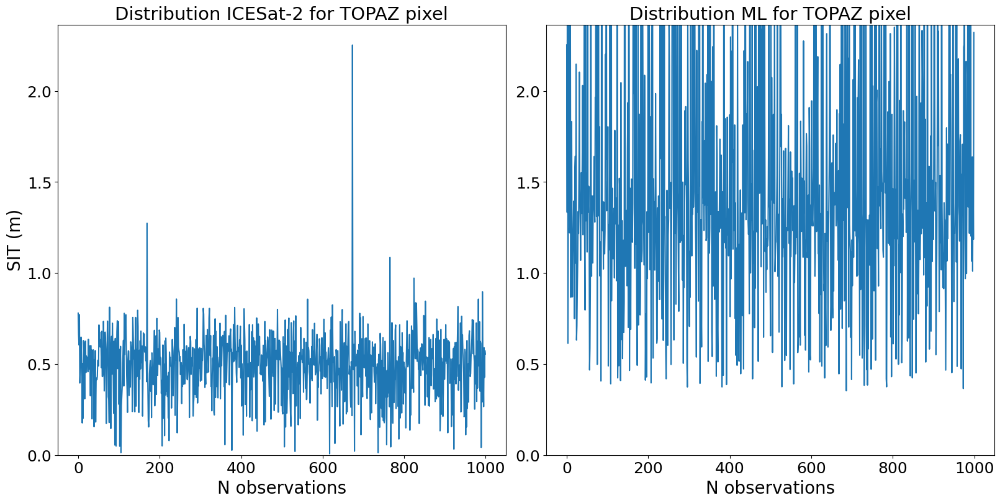

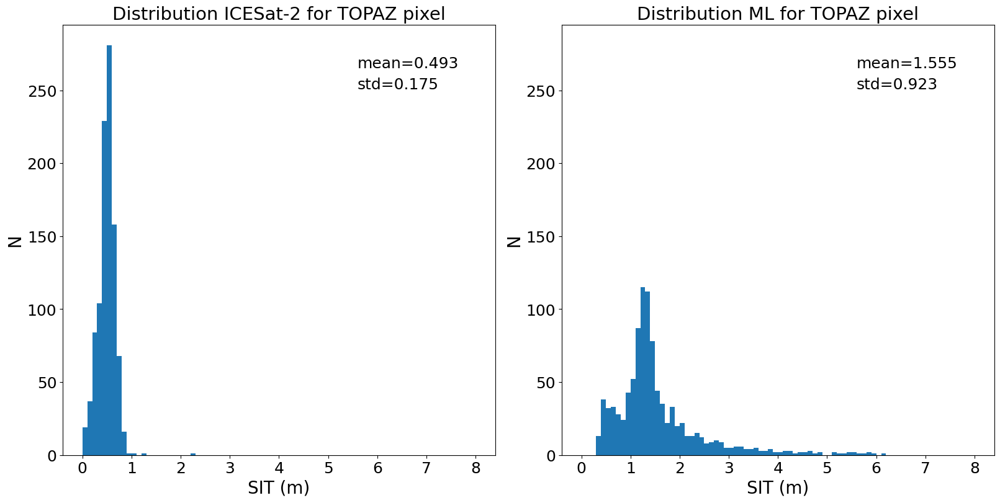

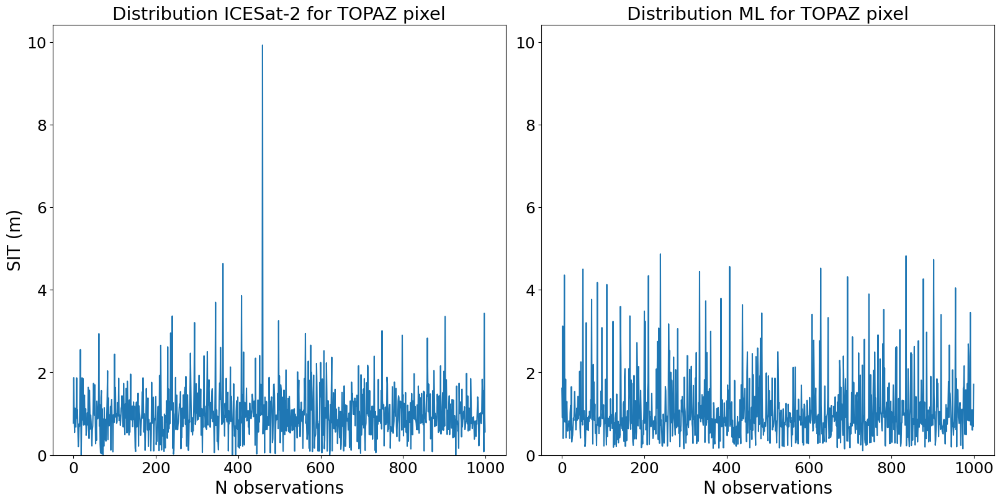

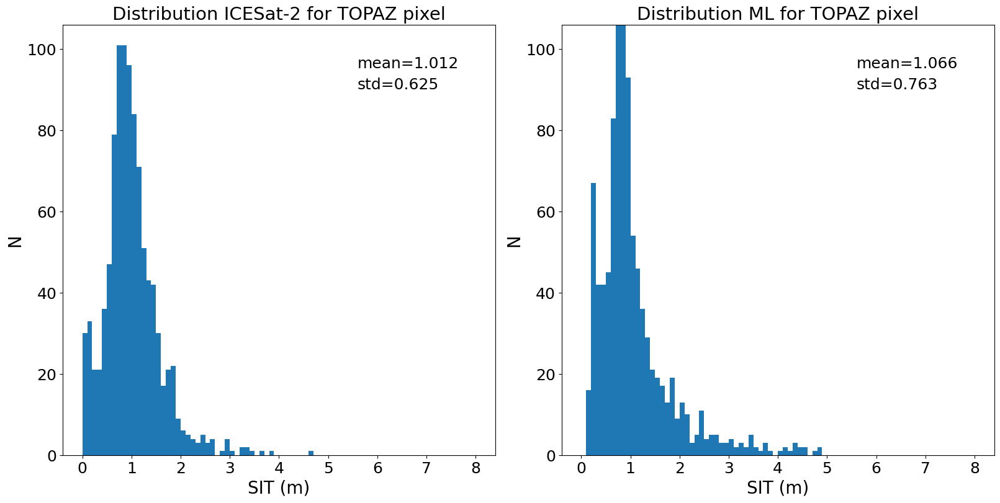

In [493]:
# ----------------------------------------
#        Evaluation on test dataset
# ----------------------------------------

m0.predict(test_generator)

ypred = m0.ypred
ytrue = ds.dataset['ytest']

# macro_idx = [0,100,200,400]
# we plot <mtest> random predictions
mtest = 5
macro_idx = [random.randint(0, ytrue.shape[0]) for i in range(mtest)]

# test kl_divergence
# import tensorflow as tf
# kl_div = tf.keras.losses.kullback_leibler_divergence

import matplotlib.pyplot as plt
from src.visualization import visu_mdl_distri as vmd

for midx in macro_idx:
    vmd.draw_yt_yp(ytrue[midx], ypred[midx], showfig=True, savefig=False, odir=odir)
    vmd.hist_yt_yp(ytrue[midx], ypred[midx], showfig=True, savefig=False, odir=odir)

#     vmd.hist_proba_yt_yp_icecat(ytrue[midx], ypred[midx], showfig=True, savefig=False, odir=odir)

    # print('KL ytrue/ypred:    ', np.sqrt(kl_div(ytrue[midx], ypred[midx])**2) )
    # print('KL ypred/ytrue:    ', np.sqrt(kl_div(ypred[midx], ytrue[midx])**2) )

## Evaluate one TOPAZ macropixel specifically

In [479]:
def cdf_bins(a,bins):
    pdf, bin_edges = np.histogram(a, bins=bins, density=True)
    cdf = np.cumsum(pdf*np.diff(bin_edges))
    return cdf

In [511]:
midx = 609 # 1810

In [512]:
bins = np.linspace(0,10,1001)

cdf_true = cdf_bins(ytrue[midx], bins=bins)  # compute CDFs
cdf_pred = cdf_bins(ypred[midx], bins=bins)

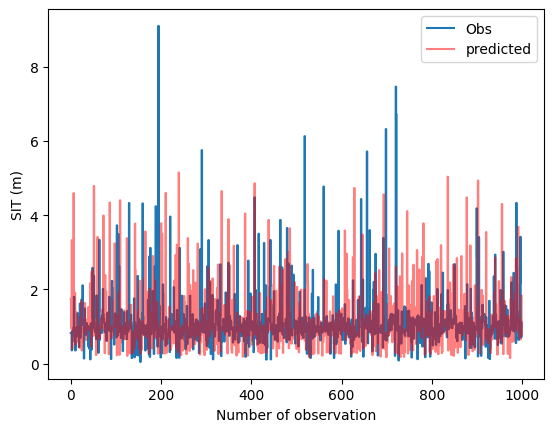

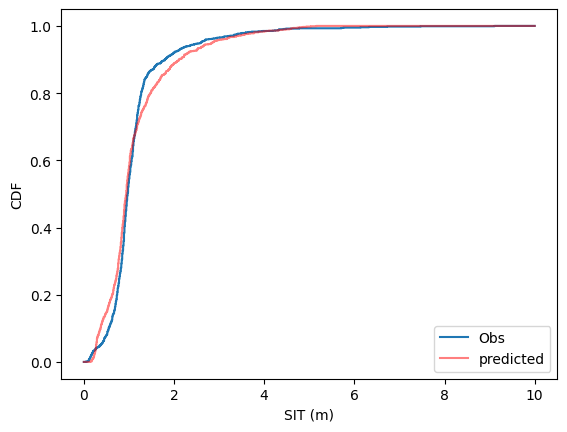

In [513]:
plt.plot(np.arange(1000), ytrue[midx], drawstyle='steps-post', label='Obs')
plt.plot(np.arange(1000), ypred[midx], 'r', drawstyle='steps-post', alpha=0.5, label='predicted')
plt.xlabel('Number of observation')
plt.ylabel('SIT (m)')
plt.legend()
plt.show()

plt.plot(np.linspace(0,10,1000), cdf_true, drawstyle='steps-post', label='Obs')
plt.plot(np.linspace(0,10,1000), cdf_pred, 'r', drawstyle='steps-post', alpha=0.5, label='predicted')
plt.ylabel('CDF')
plt.xlabel('SIT (m)')
plt.legend();

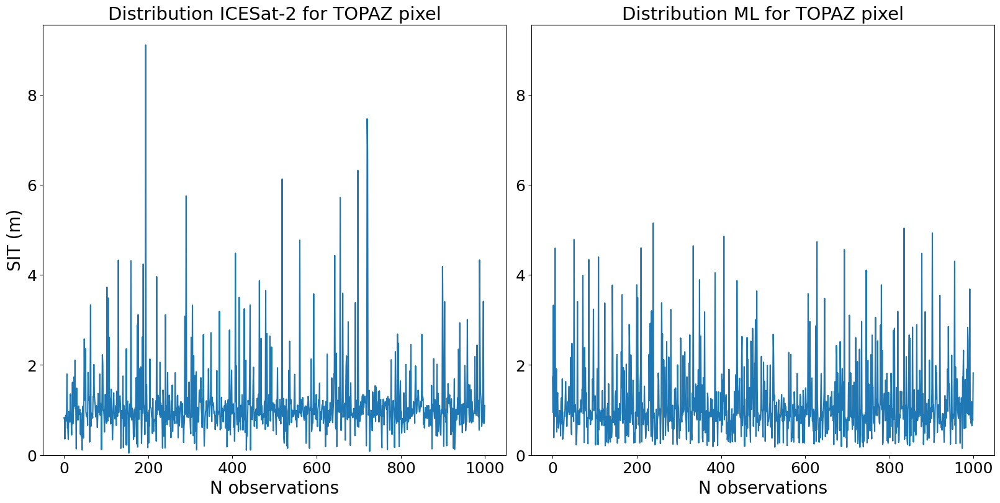

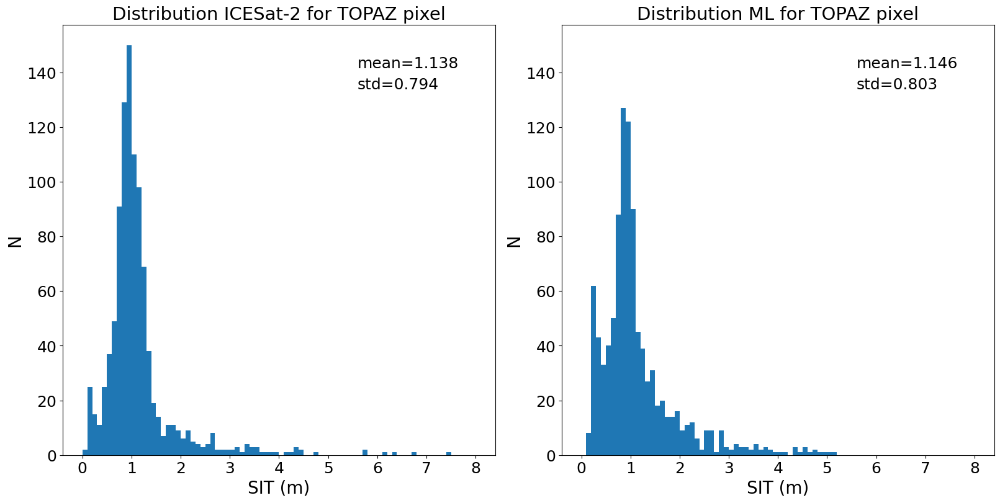

In [514]:
vmd.draw_yt_yp(ytrue[midx], ypred[midx], showfig=True, savefig=False, odir=odir)
vmd.hist_yt_yp(ytrue[midx], ypred[midx], showfig=True, savefig=False, odir=odir)

----------------------------------------------------

## Evaluate distribution

In [484]:
from src.visualization import visu_mdl_distri as vmd

In [498]:
if ds.y_as_proba:
    bias = m0.ypred - ds.dataset['ytest']
else:
    yp_pred = convert_y_to_proba(m0.ypred)
    yp_true = convert_y_to_proba(ds.dataset['ytest'])
    bias = yp_pred - yp_true

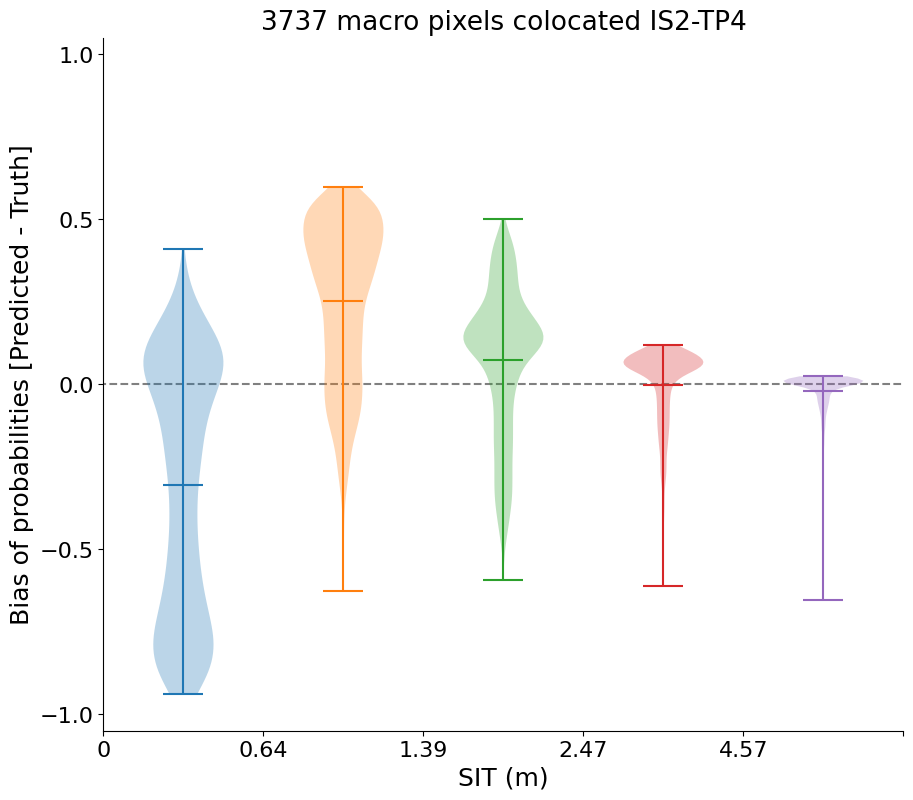

In [499]:
vmd.draw_violin_icecat(bias, showfig=True, savefig=False, odir=odir)

# ----------------------------------------------------

## Map of CRPS/KL on test dataset

In [264]:
import netCDF4 as nc4
import xarray as xr


def get_gridTP_xy():
    '''Returns grid for x and y in TOPAZ4, and SIT to access dimensions
    '''

    # Get TOPAZ4 grid
    ifile = '/scratch/project_465000269/edelleo1/Leo/Jiping_2023/TP4b/20221231_dm-12km-NERSC-MODEL-TOPAZ4B-ARC-RAN.fv2.0.nc'

    nc_tp = nc4.Dataset(f'{ifile}', mode='r')
    sit = xr.open_dataset(xr.backends.NetCDF4DataStore(nc_tp))['sithick']

    xt, yt = np.meshgrid(sit.x.to_numpy(), sit.y.to_numpy())
    
    return xt, yt, sit

In [103]:
import pyproj

def project_ll_to_tp(lon, lat):
    '''Project IS2 to TOPAZ projected coordinates
    
    Convert ICESat2 (lat, lon) to TOPAZ x/y
    '''


    # Define the input and output coordinate systems
    in_proj = pyproj.CRS('EPSG:4326')  # WGS 84 - lat/lon
    # out_proj = pyproj.CRS('EPSG:3995')  # North Polar Stereographic

    # define TOPAZ projection: a bit offset compared to North Polar Stereographic
    proj_str = ('+proj=stere +a=6378273 +b=6356889.44891 +lat_0=90 +lat_ts=70 +lon_0=-45 +x_0=10901.11 +y_0=10901.447')
    out_proj = pyproj.CRS(proj_str)

    # Create a transformer to convert from lat/lon to North Polar Stereographic
    transformer = pyproj.Transformer.from_crs(in_proj, out_proj)

    # Convert the latitude and longitude to North Polar Stereographic
    x, y = transformer.transform(lat, lon)

#     self.x, self.y = 
    
    return x/1e5, y/1e5  # from m to 100 km (used in Topaz)
    

In [34]:
# Project all results on grid
# Get averages for each grid point (or distribution of CRPS/KL)

from scipy.interpolate import griddata
import xarray as xr
import matplotlib.pyplot as plt

def interp_TPgrid(lats, lons, values, method='linear'):
    '''Project unstructured dataset (lat, lon, value) onto TOPAZ4 grid 
    Returns 2D xarray and npoints in each cell
    
    Parameters:
    -----------
    
        - lats        :    1D array, latitude for each IS2 profile 
        - lons        :    1D array, longitude for each IS2 profile 
        - values      :    1D array, Z value each IS2 profile. Such as SIT, bias, error, KL/CRPS
        - method      :    string, Method of interpolation for scipy.griddata 'linear'. 
                                   'nearest', 'linear', 'cubic'
    
    '''
    # -----------------------------------------------
    # Convert ICESat2 (lat,lon) to TOPAZ grid
    lats_c, lons_c = project_ll_to_tp(lons, lats)
    
    # get TOPAZ grid x/y
    gx, gy, gsit = get_gridTP_xy()
    
    # Make 1 array for lat/lon
    points_c = np.hstack((lats_c[:,np.newaxis], lons_c[:,np.newaxis]))    
    
    # Interpolate on TOPAZ grid
    grid_c = griddata(points_c, values, (gx, gy), method=method, fill_value=np.nan)
    
    # -----------------------------------------------
    # Compute number of points in each cell
    binx = np.concatenate((gx[0],   np.array([gx[0,-1]+ gx[0, -1] - gx[0, -2]]) ))
    biny = np.concatenate((gy[:,0], np.array([gy[-1,0]+ gx[-1, 0] - gx[-2, 0]]) ))
    bins = [biny, binx]   
    
    # Count
#     grid_nbin, _, _, _ = plt.hist2d(lons_c, lats_c, bins=bins)
    grid_nbin, _, _ = np.histogram2d(lons_c, lats_c, bins=bins)
    
    # -----------------------------------------------
    # Put nan where land
    grid_c[np.isnan(gsit.isel(time=0))] = np.nan
    grid_nbin[np.isnan(gsit.isel(time=0))] = np.nan
    
    # Cut to the area we desire
    grid_interp = grid_c[150:629, 100:550]
    grid_nbin = grid_nbin[150:629, 100:550]
    
    # Transform in xarray
    grid_z = xr.DataArray(grid_interp[np.newaxis,:,:], 
                coords={'time': gsit.time.data, 'y': gsit.y.data[150:629], 'x': gsit.x.data[100:550]}, 
                dims=["time", "y", "x"])
    grid_n = xr.DataArray(grid_nbin[np.newaxis,:,:],
                coords={'time': gsit.time.data, 'y': gsit.y.data[150:629], 'x': gsit.x.data[100:550]}, 
                dims=["time", "y", "x"])
    
    
    
    return grid_z, grid_n

# ----------------------------------------------------

In [18]:
import matplotlib.pyplot as plt

In [22]:
import tensorflow as tf

In [15]:
# ----------------------------------------
#        Evaluation on test dataset
# ----------------------------------------

m0.predict(test_generator)

ypred = m0.ypred
ytrue = ds.dataset['ytest']

NameError: name 'm0' is not defined

## ----------------------------------------------------

In [23]:
# Get KL for each predicted/truth


# y_true = ds.dataset['ytest']
# y_pred = ds.dataset['ytest'] *1.0000021554885

# ytrue = ds.dataset['ytrain']
# ypred = ds.dataset['ytrain'] *1.0000021554885

n_test = ytrue.shape[0]
n_train = ytrue.shape[0]

kl = []
for ind in range(n_train):  # ntest):
    kl += [tf.keras.backend.get_value(
        tf.keras.losses.kullback_leibler_divergence(ypred[ind], ytrue[ind]))]

kl = np.array(kl)

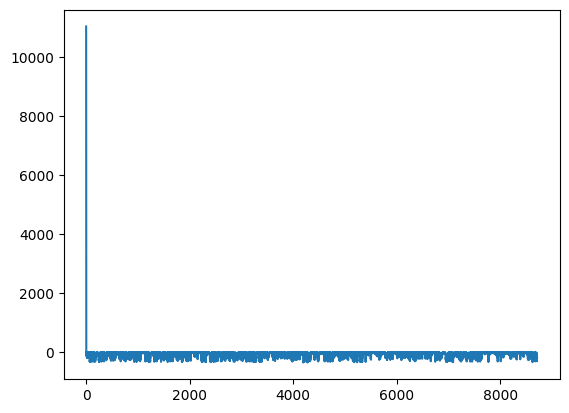

In [238]:
plt.plot(kl)

In [16]:
# Get bias SIT mean for each predicted/truth

bs = []
for ind in range(lat.size):
    bs += [np.mean(ds.dataset['y'][ind]-(1-1/(ind+100))*ds.dataset['y'][ind])]

bs = np.array(bs)

In [17]:
plt.plot(bs)

NameError: name 'plt' is not defined

In [21]:
lat = ds.sp_tp[ds.ntest, 2]  # lat
lon = ds.sp_tp[ds.ntest, 3]  # lon


# lat = ds.sp_tp[ds.ntrain, 2]  # lat
# lon = ds.sp_tp[ds.ntrain, 3]  # lon


NameError: name 'ds' is not defined

In [56]:
# Get KL
# for full dataset

lat = ds.sp_tp[:, 2]  # lat
lon = ds.sp_tp[:, 3]  # lon

kl = []
for ind in range(lat.size):
    kl += [tf.keras.backend.get_value(
        tf.keras.losses.kullback_leibler_divergence(ds.dataset['y'][ind], ds.dataset['y'][ind]*ind*1.000121))]

kl = np.array(kl)

In [49]:
from src.utils import quickplot

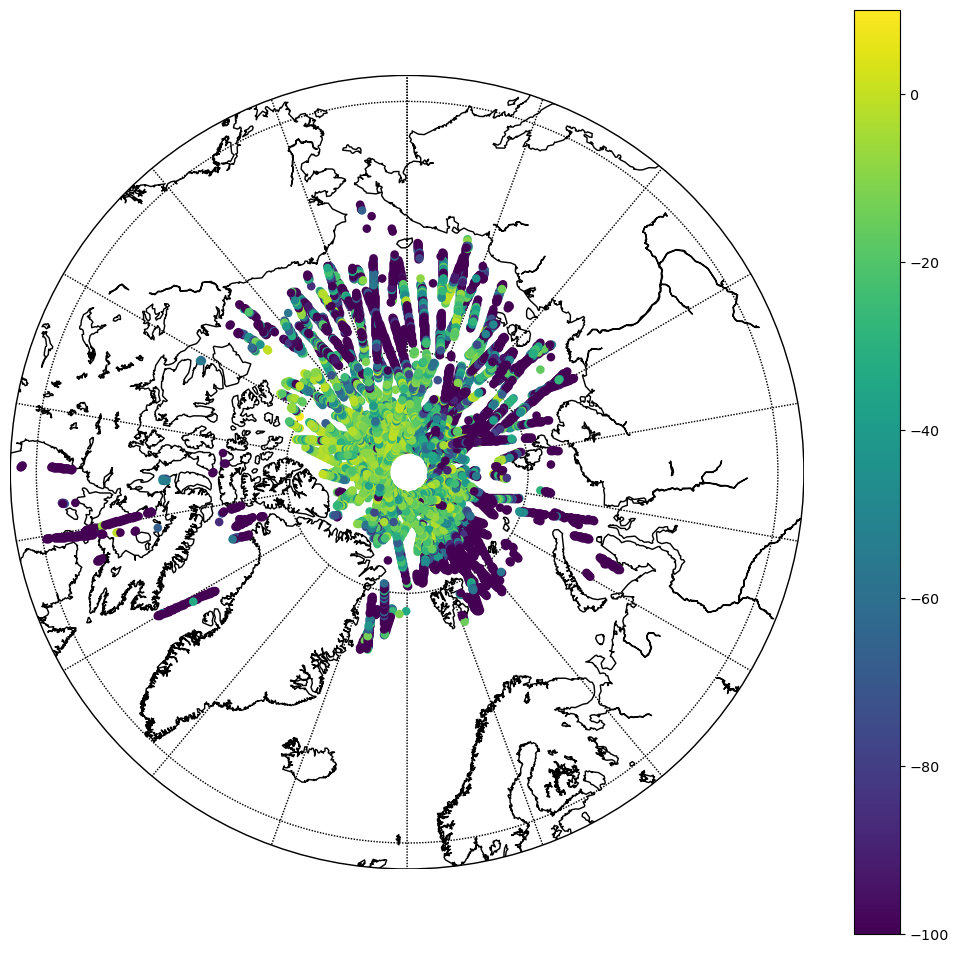

In [60]:
quickplot.basemap(lon, lat, kl, vmin=-100, vmax=10)

# ----------------------------------------------------

In [26]:
from src.data_preparation import func_distriHR as fdi

In [57]:
lat = ds.sp_tp[ds.ntest, 2]  # lat
lon = ds.sp_tp[ds.ntest, 3]  # lon

In [77]:
ds.ntest.size

3737

In [30]:
ds.sp_tp.shape

(24904, 15)

In [27]:
lat = ds.sp_tp[:, 2]  # lat
lon = ds.sp_tp[:, 3]  # lon

In [28]:
# Get bias SIT mean for each predicted/truth

bs = []
for ind in range(lat.size):
    bs += [np.mean(ds.dataset['y'][ind]-(1-1/(ind+100))*ds.dataset['y'][ind])]

bs = np.array(bs)

In [59]:
gridz, gridn, glat, glon = fdi.interp_TPgrid(lat, lon, bs, return_latlon=True)

In [58]:
reload(fdi)

<module 'src.data_preparation.func_distriHR' from '/users/edelleo1/tardis/tardis-ml/src/data_preparation/func_distriHR.py'>

In [39]:
from src.data_preparation import func_distriHR as fdi

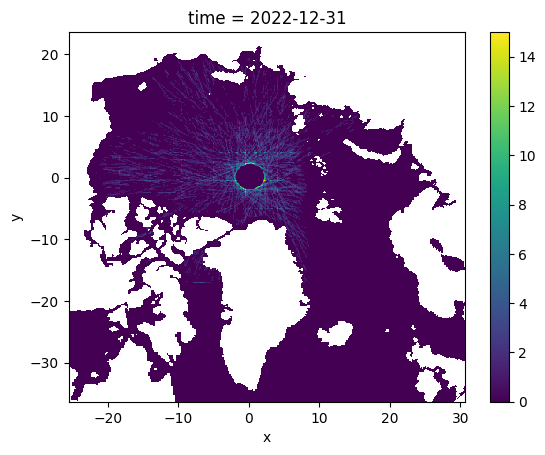

In [30]:
gridn.plot()

In [31]:
gridn

<xarray.DataArray (time: 1, y: 479, x: 450)>
array([[[nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        ...,
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan]]])
Coordinates:
  * time     (time) datetime64[ns] 2022-12-31
  * y        (y) float32 -36.25 -36.12 -36.0 -35.88 ... 23.12 23.25 23.38 23.5
  * x        (x) float32 -25.5 -25.38 -25.25 -25.12 ... 30.25 30.38 30.5 30.62

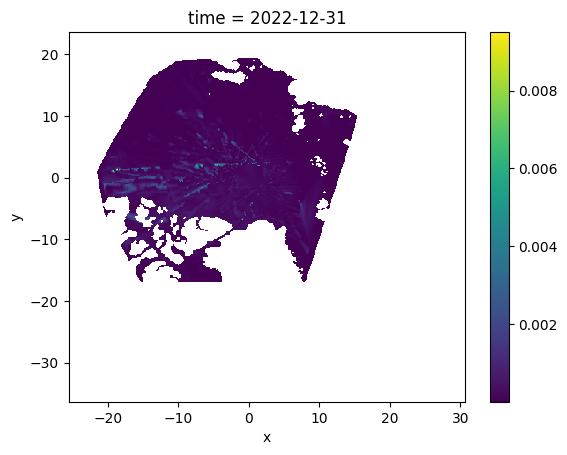

In [69]:
gridz.plot()

In [63]:
import matplotlib.pyplot as plt
from mpl_toolkits.basemap import Basemap
from src.utils import modif_plot

In [55]:
gridz

<xarray.DataArray (time: 1, y: 479, x: 450)>
array([[[nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        ...,
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan]]])
Coordinates:
  * time     (time) datetime64[ns] 2022-12-31
  * y        (y) float32 -36.25 -36.12 -36.0 -35.88 ... 23.12 23.25 23.38 23.5
  * x        (x) float32 -25.5 -25.38 -25.25 -25.12 ... 30.25 30.38 30.5 30.62

In [79]:
suptitle = f'Number of distributions on test period: {ds.ntest.size}'

draw_gz_gn(gridz, gridn, glat, glon, suptitle=suptitle)

In [84]:
def draw_gz_gn(gridz, gridn, glat, glon, suptitle='', odir='', savefig=False, showfig=True):
    '''Plot interpolation of test period profiles ICESat2 distributions (colocalized with TOPAZ4)
    and number of profiles per TOPAZ grid cell
    
    Parameters:
    -----------
        
        gridz     :    xarray 2D, mean SIT for each distribution with 1000 ICESat2 obs
        gridn     :    xarray 2D, mean SIT from macro pixel of TOPAZ
        
    '''
    
    # Draw figure
    #fig, axes = plt.subplots(ncols=2, figsize=(16, 9), constrained_layout=True, facecolor='k')
    
    fig = plt.figure(figsize=(16, 9), constrained_layout=True)

    gs1 = fig.add_gridspec(nrows=20, ncols=8, left=0.0, right=0.5, wspace=0.5)
    
    ax1 = fig.add_subplot(gs1[:, :4])  # y, x
    ax2 = fig.add_subplot(gs1[:, 4:])
    
    # -----------------------------
    ## Basemap plot
    
    # Ax1
    m = Basemap(projection='npstere', boundinglat=65, lon_0=0, resolution='l', round=True, ax=ax1)

    m.drawcoastlines()
    m.drawparallels(np.arange(-80.,81.,20.))
    m.drawmeridians(np.arange(-180.,181.,20.))

    mlons, mlats = m(glon, glat)
    cm1 = m.pcolormesh(mlons, mlats, gridz.isel(time=0).to_numpy()) # , vmin=0, vmax=5, cmap=cmap)

    # COLORBAR
    cbar = fig.colorbar(cm1, ax=ax1, shrink=0.8, orientation='horizontal', label='Mean KL') #  extend='max',
    # cax=cax1, shrink=0.2,
    #cbar.set_ticks([0,1,2,3,4,5])
    #cbar.ax.tick_params(labelsize=20)

  
    # Ax2
    cmap = plt.get_cmap('magma')  # 'bone')
    m = Basemap(projection='npstere', boundinglat=65, lon_0=0, resolution='l', round=True, ax=ax2)

    m.drawcoastlines()
    m.drawparallels(np.arange(-80.,81.,20.))
    m.drawmeridians(np.arange(-180.,181.,20.))

    mlons, mlats = m(glon, glat)
    cm1 = m.pcolormesh(mlons, mlats, gridn.isel(time=0).to_numpy(), cmap=cmap) # , vmin=0, vmax=5

    # COLORBAR
    cbar = fig.colorbar(cm1, ax=ax2, shrink=0.8, orientation='horizontal', label='Number of distributions per grid cell')


    # -----------------------------
    if suptitle != '':
        fig.suptitle(suptitle)
    
    modif_plot.resize(fig, s=20, do_annotation=False)

    if savefig:
        ofile = f'gridz_gridn.png'
        ofile = save_name.check(odir, ofile)
        plt.savefig(f"{odir}{ofile}", dpi=100, bbox_inches='tight')
        print(f'Saved as: {odir}{ofile}')

    if showfig:
        plt.show()

    plt.close()

In [ ]:
# Plot results

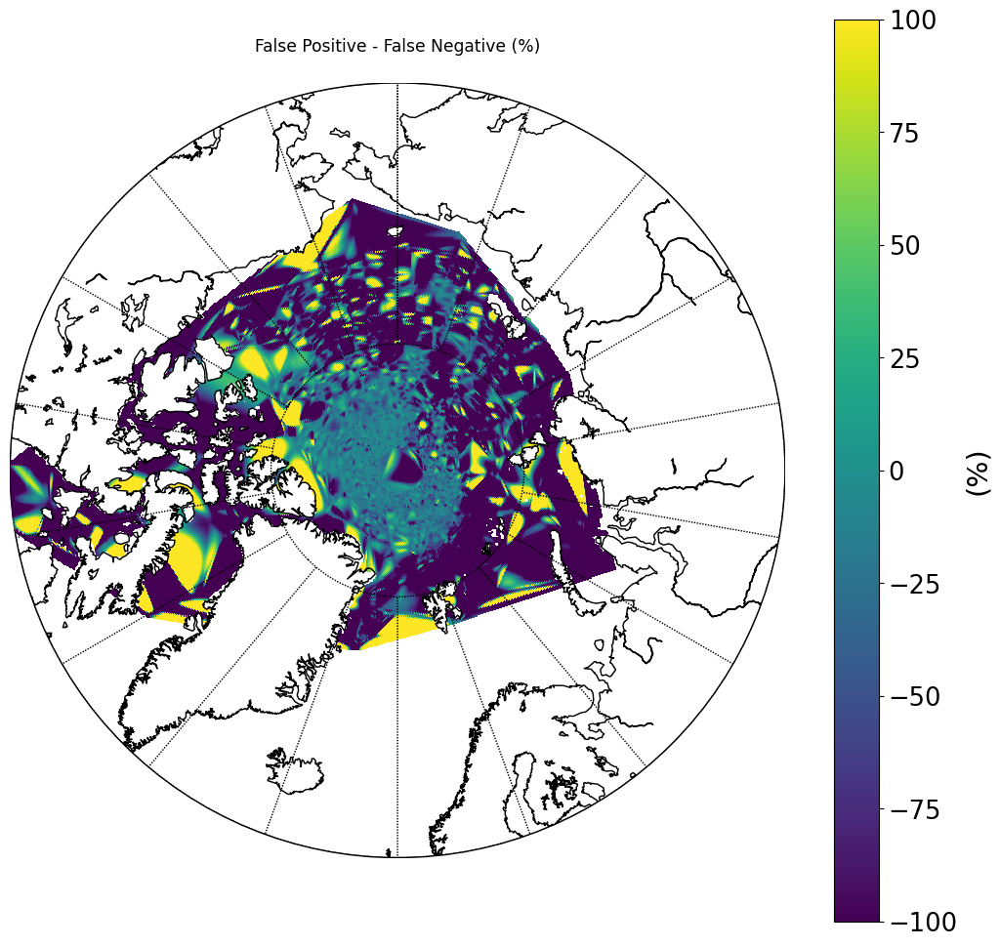

In [232]:
quickplot.basemap_mesh(gridlon, gridlat, gridz, vmin=-100, vmax=100)  # , vmin=0, vmax=100)

# -----------------------------------------------------------------

### Create config file for distri

In [429]:
ds.ntrain

array([2230, 7675, 5723, ..., 8001, 8587,  545])

In [433]:
ds.ntest

array([4011, 4760, 8324, ..., 1910, 7542, 1624])

In [432]:
ds.nval

array([5520, 7396, 4016, ..., 1060, 4636, 8152])

In [434]:
ds.ntest.shape

(1308,)

# -----------------------------------------------------------------

---------------------------

### Check consistency of prediction: sum of proba must equal 1

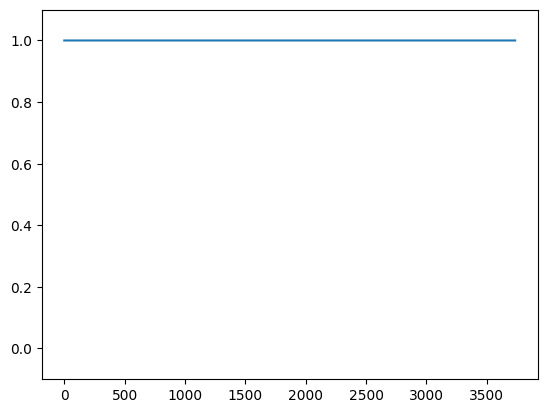

In [500]:
#yp_pred = convert_y_to_proba(m0.ypred)
tots = np.sum(yp_pred, axis=1)
plt.plot(tots)
plt.ylim([-.1,1.1]);

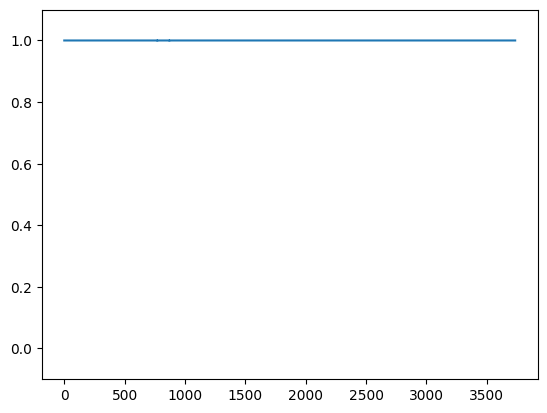

In [501]:
# yp_true = convert_y_to_proba(ds.dataset['ytest'])
plt.plot(np.sum(yp_true, axis=1))
plt.ylim([-.1,1.1]);

----------------------------------------

## Extra validation with other metrics

In [12]:
from scipy.stats import ks_2samp

import tensorflow as tf

In [503]:
kl = []
for ind in range(3737):
    kl += [tf.keras.backend.get_value(m0.perso_kl(ytrue[ind], ypred[ind]))]

kl = np.array(kl)

In [504]:
pval = []

for ind in range(3737):
    pval += [ks_2samp(ds.dataset['ytest'][ind,:], m0.ypred[ind,:])[1]]
    
pval = np.array(pval)

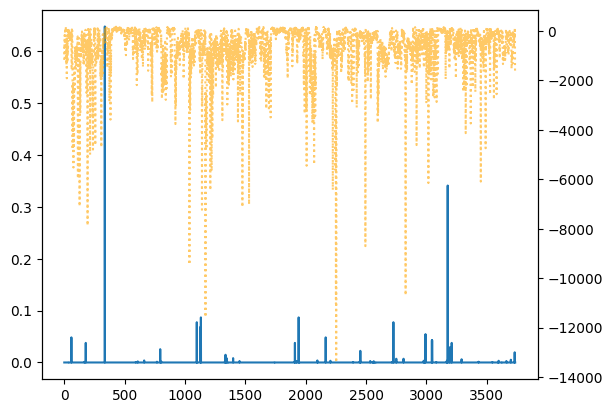

In [505]:
plt.plot(pval)
plt.twinx().plot(-kl, alpha=0.6, ls=':', c='orange')

(0.0, 1000.0)

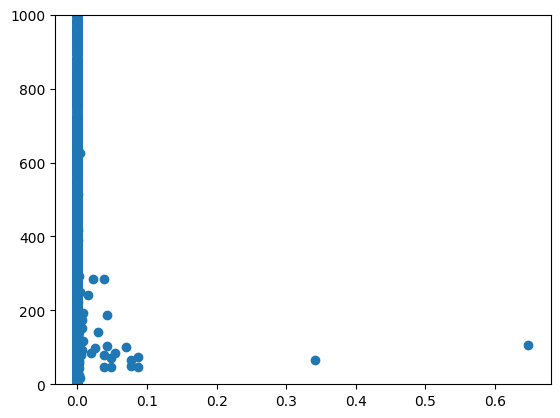

In [506]:
plt.scatter(pval, kl)
plt.ylim([0,1000])

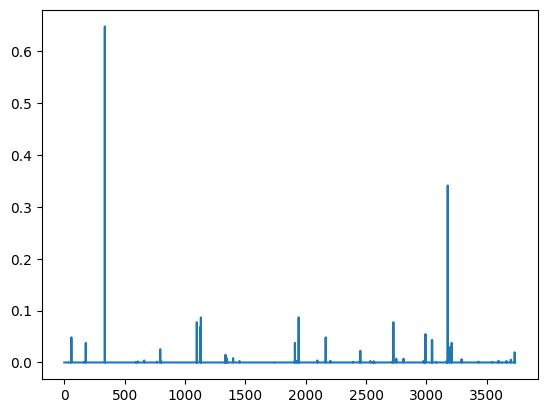

In [507]:
plt.plot(pval)

In [508]:
np.where(np.array(pval)>0.01)

(array([  59,  178,  336,  795, 1098, 1130, 1132, 1336, 1911, 1942, 2166,
        2453, 2727, 2993, 3046, 3048, 3177, 3194, 3210, 3732]),)

In [509]:
np.where(np.array(pval)>0.001)

(array([  59,  167,  178,  336,  593,  609,  662,  768,  795,  803, 1098,
        1100, 1130, 1132, 1331, 1336, 1337, 1345, 1399, 1452, 1911, 1925,
        1942, 2097, 2166, 2205, 2393, 2449, 2453, 2455, 2534, 2535, 2564,
        2566, 2715, 2727, 2751, 2811, 2978, 2992, 2993, 3046, 3048, 3170,
        3177, 3194, 3210, 3292, 3433, 3594, 3596, 3599, 3663, 3700, 3732]),)

In [510]:
np.where(np.array(pval)>0.0005)

(array([  59,  167,  178,  336,  593,  609,  662,  768,  795,  803, 1098,
        1100, 1130, 1132, 1331, 1336, 1337, 1345, 1399, 1452, 1909, 1911,
        1925, 1942, 2097, 2166, 2205, 2393, 2449, 2453, 2454, 2455, 2534,
        2535, 2555, 2562, 2564, 2566, 2715, 2727, 2751, 2811, 2978, 2992,
        2993, 3046, 3048, 3082, 3170, 3177, 3194, 3210, 3292, 3433, 3547,
        3594, 3596, 3599, 3663, 3664, 3700, 3732]),)

# ---------------------- DRAFT -------------------------------

In [105]:
def draw_density_scatter(mean, std, savefig=False, showfig=True):
    '''Plot mean VS std for each ICESat2 distributions (colocalized with TOPAZ4)
    '''
    
    n_distri = len(mean)  # number of distributions
    
    # Calculate the point density
    xy = np.vstack([mean, std])
    density = gaussian_kde(xy)(xy)

    # Sort the points by density, so that the densest points are plotted last
    idx = density.argsort()
    x, y, z = mean[idx], std[idx], density[idx]
    
    # -------------------------------------------------------------------
    fig, ax = plt.subplots(constrained_layout=True, figsize=(8,8))
    ax.set_aspect('equal')


    sc = ax.scatter(x, y, c=z, s=20, zorder=10)

    ax.plot([-1,8], [-1,8], ls=':', c='grey', zorder=-10)

    ax.set_title(f'Distribution ICESat-2 for {n_distri} TOPAZ pixels')
    ax.set_ylabel('Mean Std (m)')
    ax.set_xlabel('Mean SIT (m)')

    ax.grid(zorder=-10, ls=':')

    ax.set_xlim([-.4, 8])
    ax.set_ylim([-0.4, 8])

    fig.colorbar(sc, label='Density of distribution')
    
    
    modif_plot.resize(fig, s=18)
    
    if savefig:
        ofile = f'mean_vs_std.png'
        ofile = save_name.check(odir, ofile)
        plt.savefig(f"{odir}{ofile}", dpi=100, bbox_inches='tight')
        print(f'Saved as: {odir}{ofile}')

    if showfig:
        plt.show()

    plt.close()